#                                       DataCo Market Analysis

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools import add_constant as add_constant
import statsmodels.api as sm
import scipy.stats as st

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score,recall_score,confusion_matrix,classification_report,precision_score
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report,roc_auc_score,log_loss,f1_score

from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(criterion='entropy',random_state=0)

from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()

from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()

from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100,random_state=0)

from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier
ada=AdaBoostClassifier(random_state=0)
gb=GradientBoostingClassifier(random_state=0)
bc=BaggingClassifier(random_state=0)

from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

from sklearn.ensemble import StackingClassifier
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

import warnings
warnings.filterwarnings("ignore")

In [2]:
dataset = pd.read_csv('DataCoSupplyChainDataset.csv',encoding='unicode-escape')
dataset.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [3]:
print('The DataCo dataset has {} rows and {} columns.'.format(dataset.shape[0],dataset.shape[1]))

The DataCo dataset has 180519 rows and 53 columns.


In [4]:
dataset.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


In [5]:
dataset.describe(include=['object','bool'])

,Type,Delivery Status,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Lname,Customer Password,Customer Segment,...,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,Product Image,Product Name,shipping date (DateOrders),Shipping Mode
count,180519,180519,180519,180519,180519,180519,180519,180511,180519,180519,...,180519,180519,180519,180519,180519,180519,180519,180519,180519,180519
unique,4,4,50,563,2,1,782,1109,1,3,...,3597,164,65752,23,1089,9,118,118,63701,4
top,DEBIT,Late delivery,Cleats,Caguas,EE. UU.,XXXXXXXXX,Mary,Smith,XXXXXXXXX,Consumer,...,Santo Domingo,Estados Unidos,11/1/2015 23:44,Central America,Inglaterra,COMPLETE,http://images.acmesports.sports/Perfect+Fitnes...,Perfect Fitness Perfect Rip Deck,10/19/2015 1:52,Standard Class
freq,69295,98977,24551,66770,111146,180519,65150,64104,180519,93504,...,2211,24840,5,28341,6722,59491,24515,24515,10,107752


checking the datatype of each column.

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

filtering out only the categorical and continuous columns

In [7]:
dataset_continuous = [ col for col in dataset.select_dtypes(include=[np.number])]
dataset_categorical = [ col  for col in dataset.select_dtypes(include=[np.object])]

In [8]:
print('The continuous columns are: \n{}\n\nThe Categorical Columns are:\n{}'.format(dataset_continuous,dataset_categorical))

The continuous columns are: 
['Days for shipping (real)', 'Days for shipment (scheduled)', 'Benefit per order', 'Sales per customer', 'Late_delivery_risk', 'Category Id', 'Customer Id', 'Customer Zipcode', 'Department Id', 'Latitude', 'Longitude', 'Order Customer Id', 'Order Id', 'Order Item Cardprod Id', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price', 'Order Item Profit Ratio', 'Order Item Quantity', 'Sales', 'Order Item Total', 'Order Profit Per Order', 'Order Zipcode', 'Product Card Id', 'Product Category Id', 'Product Description', 'Product Price', 'Product Status']

The Categorical Columns are:
['Type', 'Delivery Status', 'Category Name', 'Customer City', 'Customer Country', 'Customer Email', 'Customer Fname', 'Customer Lname', 'Customer Password', 'Customer Segment', 'Customer State', 'Customer Street', 'Department Name', 'Market', 'Order City', 'Order Country', 'order date (DateOrders)', 'Order Region', 'Order State', 'Order Status

In [9]:
dataset[dataset_continuous].head(20)

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
0,3,4,91.250000,314.640015,0,73,20755,725.0,2,18.251453,...,1,327.75,314.640015,91.250000,NaN,1360,73,NaN,327.75,0
1,5,4,-249.089996,311.359985,1,73,19492,725.0,2,18.279451,...,1,327.75,311.359985,-249.089996,NaN,1360,73,NaN,327.75,0
2,4,4,-247.779999,309.720001,0,73,19491,95125.0,2,37.292233,...,1,327.75,309.720001,-247.779999,NaN,1360,73,NaN,327.75,0
3,3,4,22.860001,304.809998,0,73,19490,90027.0,2,34.125946,...,1,327.75,304.809998,22.860001,NaN,1360,73,NaN,327.75,0
4,2,4,134.210007,298.250000,0,73,19489,725.0,2,18.253769,...,1,327.75,298.250000,134.210007,NaN,1360,73,NaN,327.75,0
5,6,4,18.580000,294.980011,0,73,19488,14150.0,2,43.013969,...,1,327.75,294.980011,18.580000,NaN,1360,73,NaN,327.75,0
6,2,1,95.180000,288.420013,1,73,19487,725.0,2,18.242538,...,1,327.75,288.420013,95.180000,NaN,1360,73,NaN,327.75,0
7,2,1,68.430000,285.140015,1,73,19486,33162.0,2,25.928869,...,1,327.75,285.140015,68.430000,NaN,1360,73,NaN,327.75,0
8,3,2,133.720001,278.589996,1,73,19485,725.0,2,18.233223,...,1,327.75,278.589996,133.720001,NaN,1360,73,NaN,327.75,0
9,2,1,132.149994,275.309998,1,73,19484,94583.0,2,37.773991,...,1,327.75,275.309998,132.149994,NaN,1360,73,NaN,327.75,0


In [10]:
dataset[dataset_categorical].head(20)

,Type,Delivery Status,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Lname,Customer Password,Customer Segment,...,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,Product Image,Product Name,shipping date (DateOrders),Shipping Mode
0,DEBIT,Advance shipping,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,Holloway,XXXXXXXXX,Consumer,...,Bekasi,Indonesia,1/31/2018 22:56,Southeast Asia,Java Occidental,COMPLETE,http://images.acmesports.sports/Smart+watch,Smart watch,2/3/2018 22:56,Standard Class
1,TRANSFER,Late delivery,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,Luna,XXXXXXXXX,Consumer,...,Bikaner,India,1/13/2018 12:27,South Asia,Rajastán,PENDING,http://images.acmesports.sports/Smart+watch,Smart watch,1/18/2018 12:27,Standard Class
2,CASH,Shipping on time,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,Maldonado,XXXXXXXXX,Consumer,...,Bikaner,India,1/13/2018 12:06,South Asia,Rajastán,CLOSED,http://images.acmesports.sports/Smart+watch,Smart watch,1/17/2018 12:06,Standard Class
3,DEBIT,Advance shipping,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,Tate,XXXXXXXXX,Home Office,...,Townsville,Australia,1/13/2018 11:45,Oceania,Queensland,COMPLETE,http://images.acmesports.sports/Smart+watch,Smart watch,1/16/2018 11:45,Standard Class
4,PAYMENT,Advance shipping,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,Hendricks,XXXXXXXXX,Corporate,...,Townsville,Australia,1/13/2018 11:24,Oceania,Queensland,PENDING_PAYMENT,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 11:24,Standard Class
5,TRANSFER,Shipping canceled,Sporting Goods,Tonawanda,EE. UU.,XXXXXXXXX,Kimberly,Flowers,XXXXXXXXX,Consumer,...,Toowoomba,Australia,1/13/2018 11:03,Oceania,Queensland,CANCELED,http://images.acmesports.sports/Smart+watch,Smart watch,1/19/2018 11:03,Standard Class
6,DEBIT,Late delivery,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,Terrell,XXXXXXXXX,Home Office,...,Guangzhou,China,1/13/2018 10:42,Eastern Asia,Guangdong,COMPLETE,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 10:42,First Class
7,TRANSFER,Late delivery,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,Stevens,XXXXXXXXX,Corporate,...,Guangzhou,China,1/13/2018 10:21,Eastern Asia,Guangdong,PROCESSING,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 10:21,First Class
8,CASH,Late delivery,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Nichole,Olsen,XXXXXXXXX,Corporate,...,Guangzhou,China,1/13/2018 10:00,Eastern Asia,Guangdong,CLOSED,http://images.acmesports.sports/Smart+watch,Smart watch,1/16/2018 10:00,Second Class
9,CASH,Late delivery,Sporting Goods,San Ramon,EE. UU.,XXXXXXXXX,Oprah,Delacruz,XXXXXXXXX,Corporate,...,Guangzhou,China,1/13/2018 9:39,Eastern Asia,Guangdong,CLOSED,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 9:39,First Class


###### Skewness

In [11]:
dataset.skew()

Days for shipping (real)         8.477127e-02
Days for shipment (scheduled)   -7.319983e-01
Benefit per order               -4.741834e+00
Sales per customer               2.888446e+00
Late_delivery_risk              -1.940742e-01
Category Id                      3.616248e-01
Customer Id                      4.887683e-01
Customer Zipcode                 4.908834e-01
Department Id                    2.733206e-01
Latitude                        -9.796267e-02
Longitude                       -4.984611e-01
Order Customer Id                4.887683e-01
Order Id                         3.270879e-02
Order Item Cardprod Id           1.382546e-01
Order Item Discount              3.039796e+00
Order Item Discount Rate         3.409276e-01
Order Item Id                    8.455466e-18
Order Item Product Price         3.191020e+00
Order Item Profit Ratio         -2.893531e+00
Order Item Quantity              8.802518e-01
Sales                            2.884249e+00
Order Item Total                 2

###### kurtosis

In [12]:
dataset.kurt()

Days for shipping (real)         -1.007914
Days for shipment (scheduled)    -1.022949
Benefit per order                71.377259
Sales per customer               23.920362
Late_delivery_risk               -1.962357
Category Id                      -0.603261
Customer Id                       0.014899
Customer Zipcode                 -1.451419
Department Id                    -0.181697
Latitude                         -1.555415
Longitude                         2.180982
Order Customer Id                 0.014899
Order Id                         -1.152936
Order Item Cardprod Id           -1.267494
Order Item Discount              25.231267
Order Item Discount Rate         -0.901157
Order Item Id                    -1.200000
Order Item Product Price         23.312997
Order Item Profit Ratio          10.157225
Order Item Quantity              -0.753702
Sales                            23.936561
Order Item Total                 23.920362
Order Profit Per Order           71.377259
Order Zipco

Checking Null Values in the dataset

In [13]:
(dataset.isnull().sum()/len(dataset))*100

Type                               0.000000
Days for shipping (real)           0.000000
Days for shipment (scheduled)      0.000000
Benefit per order                  0.000000
Sales per customer                 0.000000
Delivery Status                    0.000000
Late_delivery_risk                 0.000000
Category Id                        0.000000
Category Name                      0.000000
Customer City                      0.000000
Customer Country                   0.000000
Customer Email                     0.000000
Customer Fname                     0.000000
Customer Id                        0.000000
Customer Lname                     0.004432
Customer Password                  0.000000
Customer Segment                   0.000000
Customer State                     0.000000
Customer Street                    0.000000
Customer Zipcode                   0.001662
Department Id                      0.000000
Department Name                    0.000000
Latitude                        

The two columns Order zipcode and order description both have highest null values, and for the3 given problem the zipcode is not required and also the description is also not required, so dropping the two columns.

In [14]:
dataset.drop(['Order Zipcode','Product Description'],axis=1,inplace=True)

Our main objective from the dataset is to understand if a customer is a FRAUDULENT or NON_FRAUDULANT customer, which is recorder in the columns Order Status

In [15]:
print('The unique categories present for the order status are:\n',dataset['Order Status'].unique())

The unique categories present for the order status are:
 ['COMPLETE' 'PENDING' 'CLOSED' 'PENDING_PAYMENT' 'CANCELED' 'PROCESSING'
 'SUSPECTED_FRAUD' 'ON_HOLD' 'PAYMENT_REVIEW']


Lets check the percentage of data that is categories for each of these.

In [16]:
dataset['Order Status'].value_counts(normalize=True)*100

COMPLETE           32.955534
PENDING_PAYMENT    22.065267
PROCESSING         12.132795
PENDING            11.204915
CLOSED             10.866446
ON_HOLD             5.431007
SUSPECTED_FRAUD     2.250179
CANCELED            2.045214
PAYMENT_REVIEW      1.048643
Name: Order Status, dtype: float64

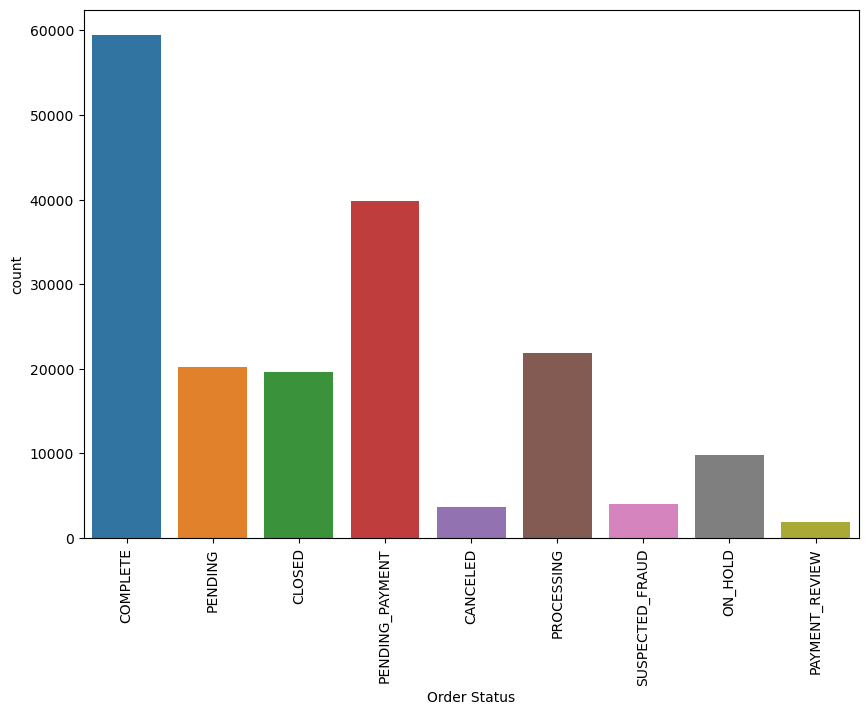

In [17]:
plt.figure(figsize=(10,7),dpi=100)
sns.countplot(dataset['Order Status'])
plt.xticks(rotation='90')
plt.show()

The Categories Complete, Processing, Closed, Canceled can be categorised as NON-FRAUD as the order is processed or in processing state.
The Categories PENDING_PAYMENT, PENDING, ON_HOLD, SUSPECTED-FRAUD, PAYMENT_REVIEW can be categorised as FRAUDULANT as the order is on hold, or on review.

Chnaging the same in the dataset

In [18]:
for i in range(0,len(dataset['Order Status'])):
    if((dataset['Order Status'][i] == 'COMPLETE') | (dataset['Order Status'][i] == 'PROCESSING') |
       (dataset['Order Status'][i] == 'CLOSED') | (dataset['Order Status'][i] == 'CANCELED')):
        dataset['Order Status'][i] = 'NOT_FRAUD'
    else:
        dataset['Order Status'][i] = 'FRAUD'

Now lets the check the distribution again with the categories

In [19]:
dataset['Order Status'].value_counts(normalize=True)*100

NOT_FRAUD    57.999989
FRAUD        42.000011
Name: Order Status, dtype: float64

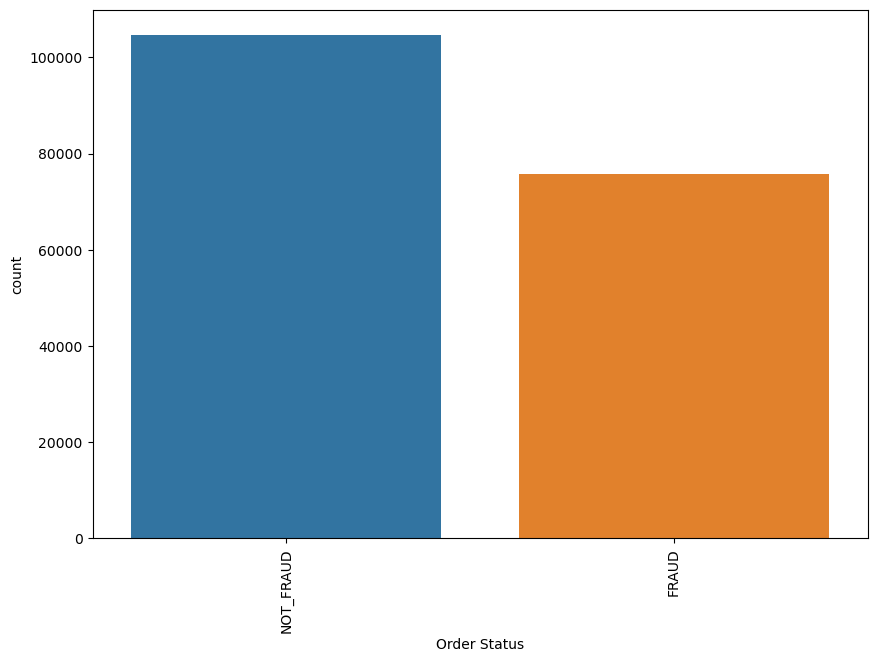

In [20]:
plt.figure(figsize=(10,7),dpi=100)
sns.countplot(dataset['Order Status'])
plt.xticks(rotation='90')
plt.show()

##### EDA on the Numerical Columns:

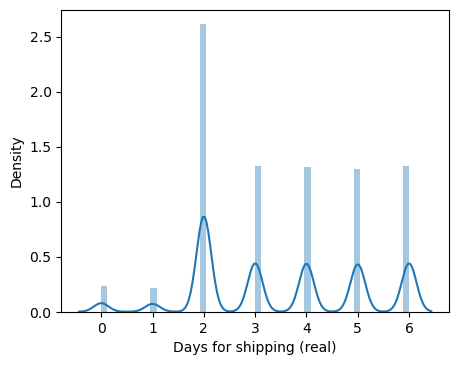

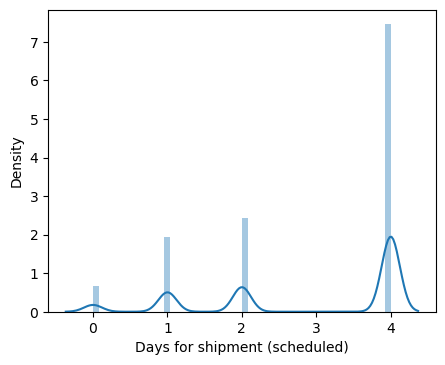

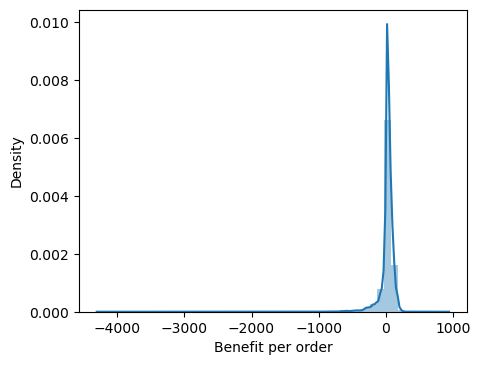

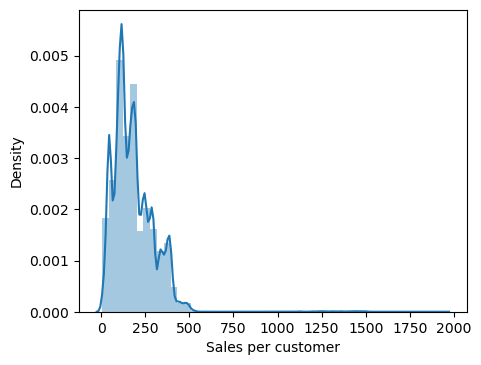

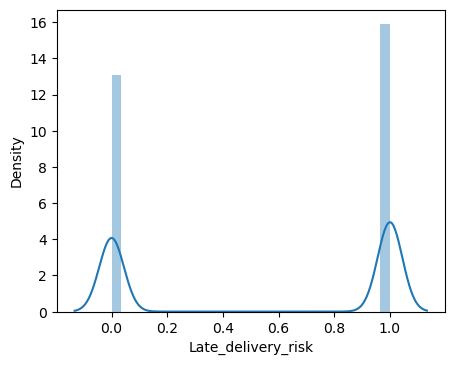

...

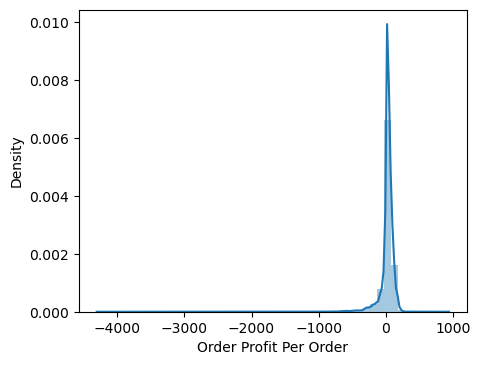

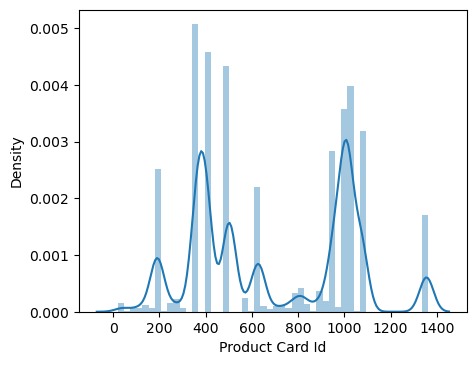

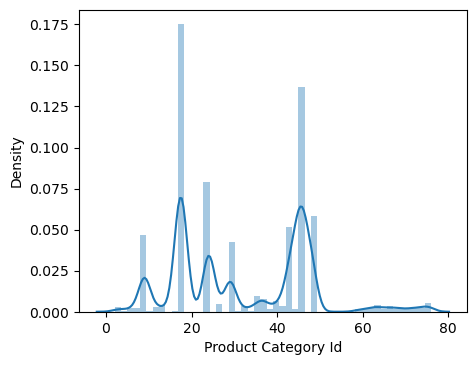

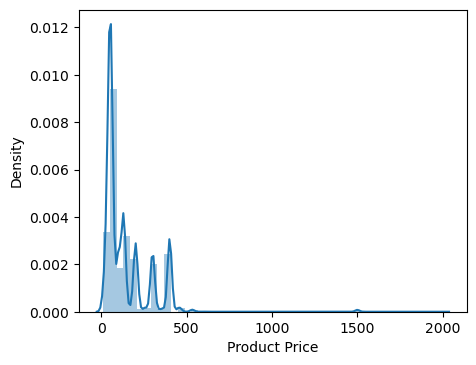

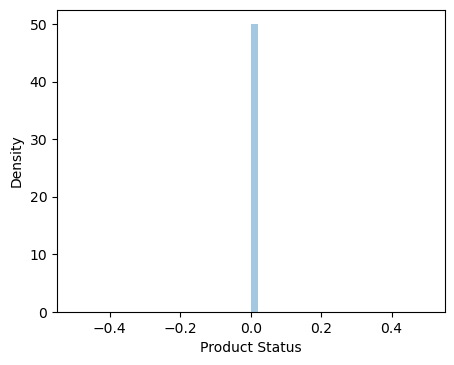

In [21]:
for col in dataset.select_dtypes(include=[np.number]):
    plt.figure(figsize=(5,4),dpi=100)
    sns.distplot(dataset[col])
    plt.show()

Days for shipping(real) and Days for shipping(scheduled) are telling the number of days it took to deliver the order, why not create 1 column telling if the order shipment was delayed, on-time or before-time

In [22]:
dataset.loc[:,['Days for shipment (scheduled)','Days for shipping (real)']]

,Days for shipment (scheduled),Days for shipping (real)
0,4,3
1,4,5
2,4,4
3,4,3
4,4,2
...,...,...
180514,4,4
180515,2,3
180516,4,5
180517,4,3


In [23]:
dataset['Order Shipment'] = dataset['Days for shipment (scheduled)'] - dataset['Days for shipping (real)']

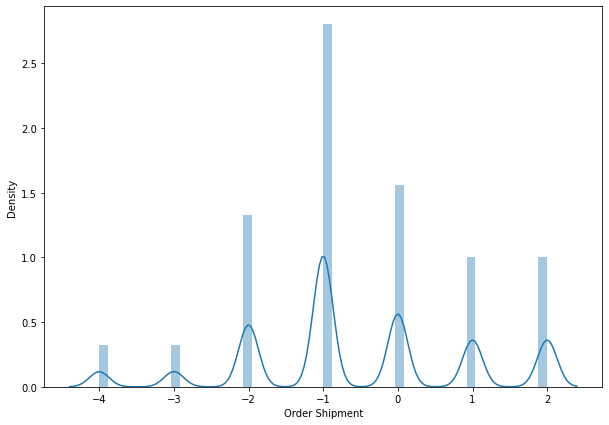

In [24]:
plt.figure(figsize=(10,7))
sns.distplot(dataset['Order Shipment'])
plt.show()

Now we can encode the same to on-time for 0 days, delay for days with negative value, before time for days with positive value.

In [25]:
dataset['Order Shipment'].value_counts()

-1    60647
 0    33753
-2    28718
 1    21700
 2    21666
-3     7052
-4     6983
Name: Order Shipment, dtype: int64

In [26]:
dataset['Order Shipment'] = dataset['Order Shipment'].astype(np.number)

In [27]:
for i in range(0,len(dataset['Order Shipment'])):
    if(dataset['Order Shipment'][i] < 0):
        dataset['Order Shipment'][i] = 'DELAY'
    elif(dataset['Order Shipment'][i] > 0):
        dataset['Order Shipment'][i] = 'BEFORE_TIME'
    else:
        dataset['Order Shipment'][i] = 'ON_TIME'

In [28]:
dataset["Order Shipment"].value_counts(normalize=True)*100

DELAY          57.279289
BEFORE_TIME    24.022956
ON_TIME        18.697755
Name: Order Shipment, dtype: float64

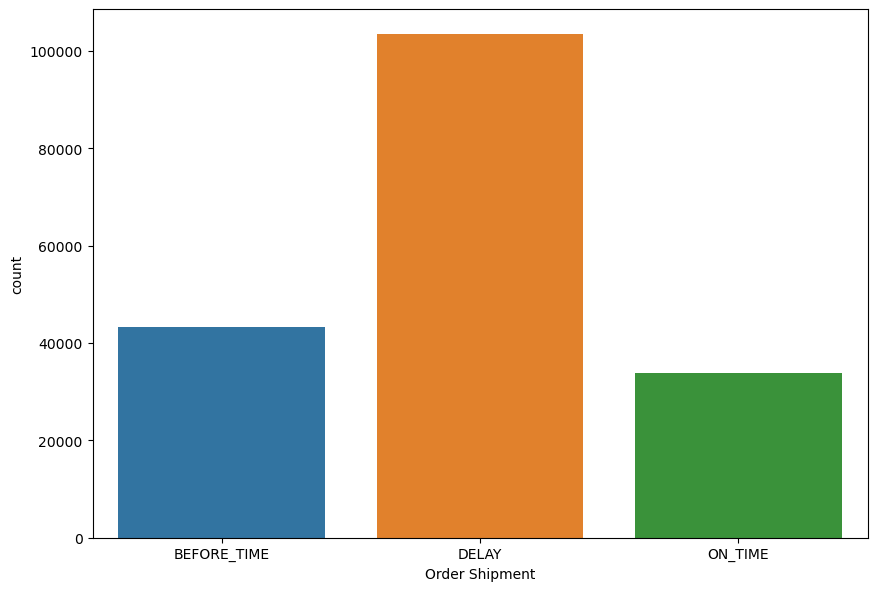

In [29]:
plt.figure(figsize=(10,7),dpi=100)
sns.countplot(dataset['Order Shipment'])
plt.show()

In [30]:
dataset.drop(['Days for shipment (scheduled)','Days for shipping (real)'],axis=1,inplace=True)

Lets check on other numerical and categorical columns

Since, we dropped 1 zipcode column initially lets go ahead and drop it from other columns as well

In [31]:
dataset.drop(['Customer Zipcode'],axis=1,inplace=True)

Product Status has only one value 0 that is 0 lets go ahead and drop the same from the dataset

In [32]:
dataset.drop(['Product Status'],axis=1,inplace=True)

We will also be dropping the column Late delivery risk, as in the future we will calculate the time for delivery

In [33]:
dataset.drop('Late_delivery_risk',axis=1,inplace=True)

From the customer email and password can be removed as both our truncated, customer Fname and lname also can be removed as customer ID is present,Product Image can be removed as it is a hyper link which is not usefull, shipping data can be removed as we already have created a new column telling us if the shipment is delayed or not.

In [34]:
dataset.drop(['Customer Email','Customer Password','Customer Fname','Customer Lname'
              ,'Product Image','shipping date (DateOrders)'],axis=1,inplace=True)

From the numerical columns Benefit per order and Order Profit Per Order are both the same.

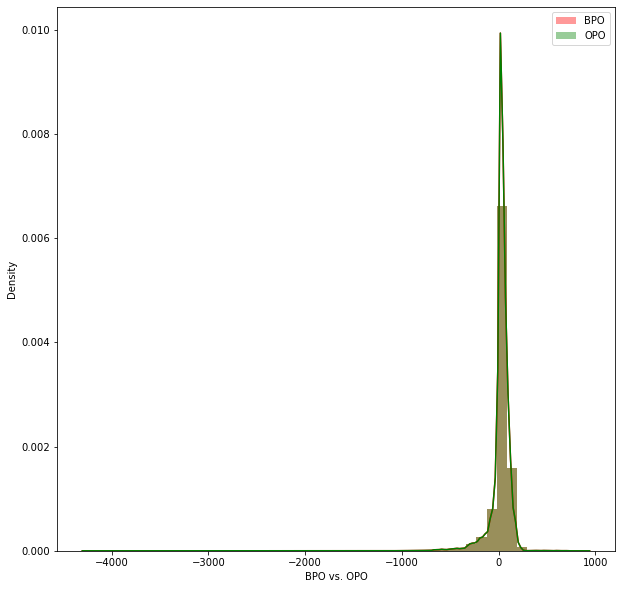

In [35]:
plt.figure(figsize=(10,10))
sns.distplot(dataset['Benefit per order'],color='r',label='BPO')
sns.distplot(dataset['Order Profit Per Order'],color='g',label='OPO')
plt.xlabel('BPO vs. OPO')
plt.legend()
plt.show()

We are going ahead and dropping the column  Order Profit Per Order as it is redundant

In [36]:
dataset.drop('Order Profit Per Order',axis=1,inplace=True)

In [37]:
dataset.select_dtypes(include=[np.number]).columns

Index(['Benefit per order', 'Sales per customer', 'Category Id', 'Customer Id',
       'Department Id', 'Latitude', 'Longitude', 'Order Customer Id',
       'Order Id', 'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Product Card Id', 'Product Category Id',
       'Product Price'],
      dtype='object')

In [38]:
dataset.select_dtypes(include=[np.object]).columns

Index(['Type', 'Delivery Status', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Segment', 'Customer State',
       'Customer Street', 'Department Name', 'Market', 'Order City',
       'Order Country', 'order date (DateOrders)', 'Order Region',
       'Order State', 'Order Status', 'Product Name', 'Shipping Mode',
       'Order Shipment'],
      dtype='object')

In [39]:
len(dataset.columns)

40

# Univariate and Bivariate Analysis

Our target column is the Order Status column so lets to go ahead and try to explore the data keeping the target 

Lets find the department which has the highest number of fraud customers.

In [40]:
fraud_dataset = dataset[dataset['Order Status']=='FRAUD']

In [41]:
fraud_dataset.groupby('Department Id')['Order Status'].value_counts().sort_values(ascending=False)

Department Id  Order Status
7              FRAUD           28257
4              FRAUD           20619
5              FRAUD           13910
3              FRAUD            6057
6              FRAUD            3986
2              FRAUD            1051
9              FRAUD             847
10             FRAUD             578
11             FRAUD             197
8              FRAUD             182
12             FRAUD             134
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Department Id,Order Status'>

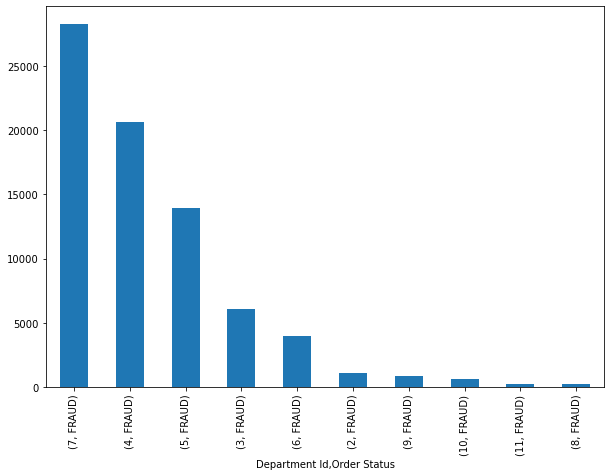

In [42]:
fraud_dataset.groupby('Department Id')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

From the above outputs we see that department 7 has highest number of fraud customers.

Lets find the customer who has highest number of fraud orders.

In [43]:
fraud_dataset.groupby('Customer Id')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Customer Id  Order Status
341          FRAUD           31
5097         FRAUD           31
5648         FRAUD           30
12039        FRAUD           28
5146         FRAUD           28
2508         FRAUD           27
2292         FRAUD           26
9821         FRAUD           26
1657         FRAUD           26
2224         FRAUD           26
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Customer Id,Order Status'>

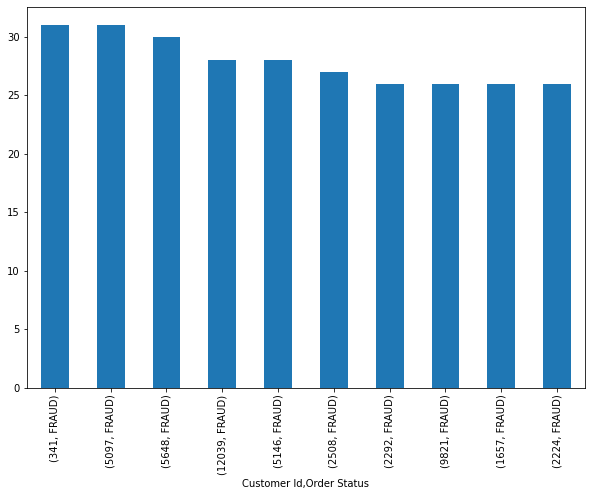

In [44]:
fraud_dataset.groupby('Customer Id')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above output shows the top 10 customer id's who are fraudulant customers

Lets try to find the products the fradulant customers try to purchase.

In [45]:
fraud_dataset.groupby('Product Card Id')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Product Card Id  Order Status
365              FRAUD           10356
403              FRAUD            9310
502              FRAUD            8842
1014             FRAUD            8236
1004             FRAUD            7325
1073             FRAUD            6519
957              FRAUD            5739
191              FRAUD            5029
627              FRAUD            4409
1362             FRAUD             355
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Product Card Id,Order Status'>

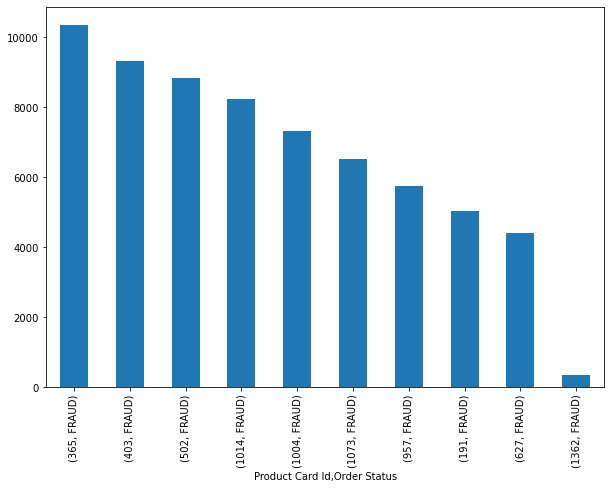

In [46]:
fraud_dataset.groupby('Product Card Id')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above output shows the top 10 product id's which a fradulant person will try to fraud the company.

Similarly lets try to find the category as well.

In [47]:
fraud_dataset.groupby('Product Category Id')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Product Category Id  Order Status
17                   FRAUD           10374
18                   FRAUD            9310
24                   FRAUD            8842
46                   FRAUD            8236
45                   FRAUD            7325
48                   FRAUD            6535
43                   FRAUD            5739
9                    FRAUD            5161
29                   FRAUD            4571
37                   FRAUD             869
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Product Category Id,Order Status'>

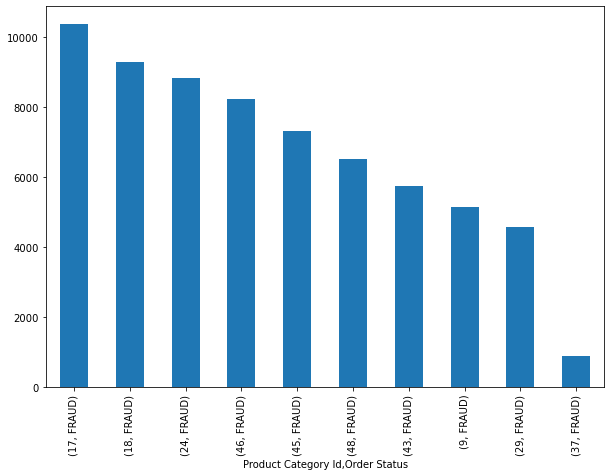

In [48]:
fraud_dataset.groupby('Product Category Id')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above output shows the top 10 categories which a fradulant person will try to commit fraud

In [49]:
fraud_dataset.groupby('Order Item Quantity')['Order Status'].value_counts().sort_values(ascending=False)

Order Item Quantity  Order Status
1                    FRAUD           41597
5                    FRAUD            8631
2                    FRAUD            8540
3                    FRAUD            8533
4                    FRAUD            8517
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Order Item Quantity,Order Status'>

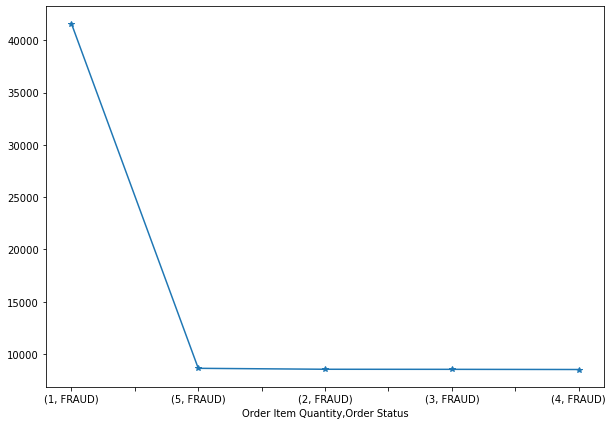

In [50]:
fraud_dataset.groupby('Order Item Quantity')['Order Status'].value_counts().sort_values(ascending=False).plot(kind='line',figsize=(10,7),marker='*')

From the above plot we see that fraudsters order quantity is most of the times of single quantity

Now lets try to see where the fradulant customers are originating from using the Longitude and latitude

In [51]:
import plotly.express as px

In [52]:
fig = px.density_mapbox(dataset, lat='Latitude', lon='Longitude', radius=10,
                        center=dict(lat=0, lon=180), zoom=0,
                        mapbox_style="stamen-terrain")
fig.show()

Above output shows the concentration of customers around the world using a world map

We no longer require the longitude and the latitude columns so going ahead and dropping the same.

In [53]:
dataset.drop(['Latitude','Longitude'],axis=1,inplace=True)

<AxesSubplot:ylabel='Type'>

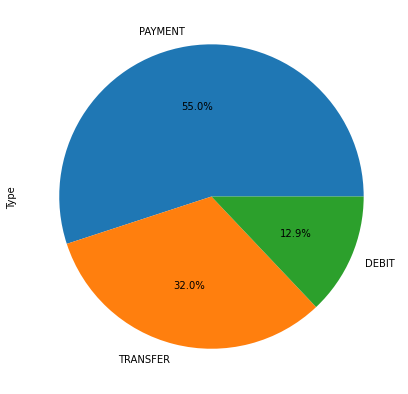

In [54]:
fraud_dataset['Type'].value_counts(normalize=True).plot(kind='pie',autopct='%1.1f%%',figsize=(10,7))

The above pie chart shows what payment method does a fraudster use.

In [55]:
fraud_dataset.groupby(['Customer City'])['Order Status'].value_counts().sort_values(ascending=False).head(10)

Customer City  Order Status
Caguas         FRAUD           28293
Chicago        FRAUD            1637
Brooklyn       FRAUD            1444
Los Angeles    FRAUD            1386
New York       FRAUD             708
San Diego      FRAUD             663
Bronx          FRAUD             651
Philadelphia   FRAUD             650
Miami          FRAUD             562
Houston        FRAUD             532
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Customer City,Order Status'>

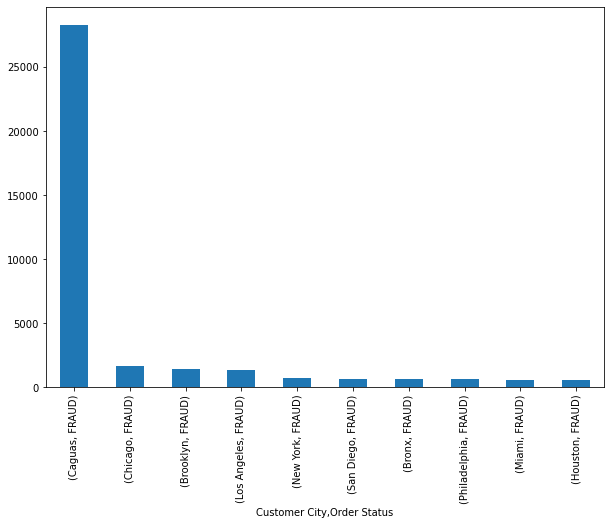

In [56]:
fraud_dataset.groupby(['Customer City'])['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above plot shows the top 10 cities with the highest number of fradulent customers.

In [57]:
fraud_dataset.groupby(['Customer Country'])['Order Status'].value_counts().head(10)

Customer Country  Order Status
EE. UU.           FRAUD           46485
Puerto Rico       FRAUD           29333
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Customer Country,Order Status'>

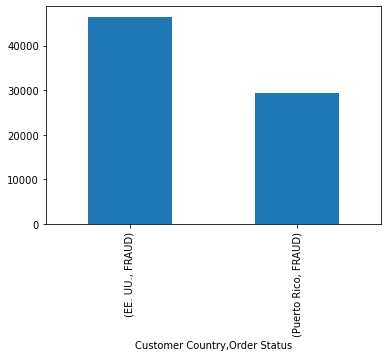

In [58]:
fraud_dataset.groupby(['Customer Country'])['Order Status'].value_counts().head(10).plot(kind='bar')

The above plot shows the Fraud rate for the diffrent countries

In [59]:
fraud_dataset.groupby('Customer Segment')['Order Status'].value_counts().sort_values(ascending=False)

Customer Segment  Order Status
Consumer          FRAUD           39507
Corporate         FRAUD           22967
Home Office       FRAUD           13344
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Customer Segment,Order Status'>

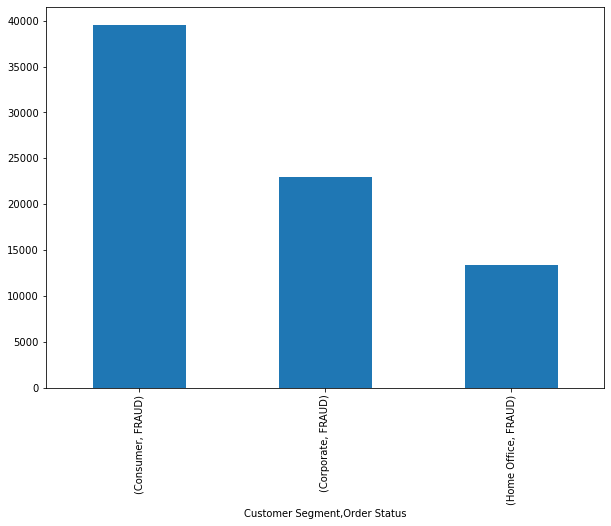

In [60]:
fraud_dataset.groupby('Customer Segment')['Order Status'].value_counts().sort_values(ascending=False).plot(kind='bar',figsize=(10,7))

The above output shows the Customer segments which our under fradulent activities

In [61]:
fraud_dataset.groupby('Customer State')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Customer State  Order Status
PR              FRAUD           29333
CA              FRAUD           12116
NY              FRAUD            4835
TX              FRAUD            3727
IL              FRAUD            3132
FL              FRAUD            2249
OH              FRAUD            1729
PA              FRAUD            1645
MI              FRAUD            1588
NJ              FRAUD            1341
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Customer State,Order Status'>

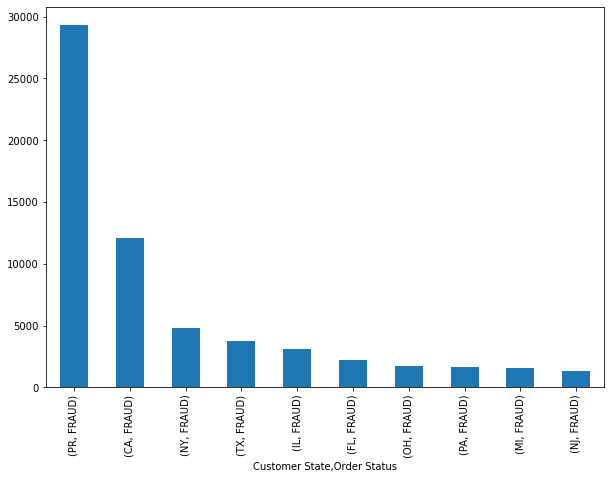

In [62]:
fraud_dataset.groupby('Customer State')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above output shows the number of fradulant orders for the top 10 cities.

In [63]:
fraud_dataset.groupby('Market')['Order Status'].value_counts().sort_values(ascending=False)

Market        Order Status
LATAM         FRAUD           21642
Europe        FRAUD           21144
Pacific Asia  FRAUD           17768
USCA          FRAUD           10523
Africa        FRAUD            4741
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Market,Order Status'>

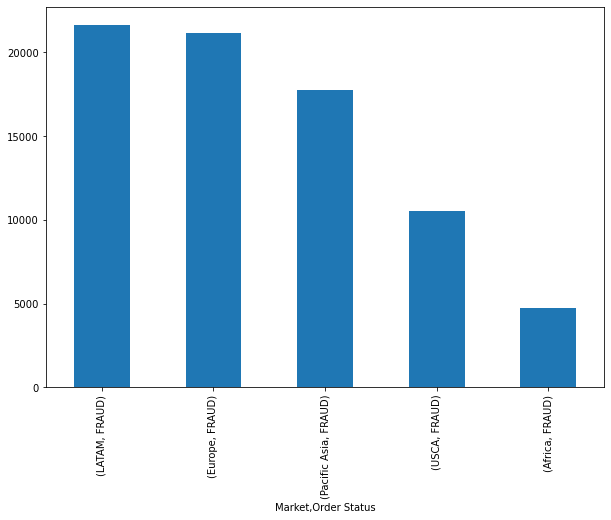

In [64]:
fraud_dataset.groupby('Market')['Order Status'].value_counts().sort_values(ascending=False).plot(kind='bar',figsize=(10,7))

The above plot shows the diffrent market regions where fradulant activities happen

In [65]:
fraud_dataset.groupby('Order City')['Order Status'].value_counts().sort_values(ascending=False).head(20)

Order City      Order Status
Santo Domingo   FRAUD           887
New York City   FRAUD           798
Los Angeles     FRAUD           784
Tegucigalpa     FRAUD           759
Managua         FRAUD           755
Mexico City     FRAUD           639
Manila          FRAUD           630
Philadelphia    FRAUD           525
San Francisco   FRAUD           513
San Salvador    FRAUD           503
London          FRAUD           476
Berlín          FRAUD           429
Viena           FRAUD           423
Seattle         FRAUD           421
Bangkok         FRAUD           408
Yakarta         FRAUD           398
San Pedro Sula  FRAUD           385
Paris           FRAUD           384
Buenos Aires    FRAUD           375
São Paulo       FRAUD           371
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Order City,Order Status'>

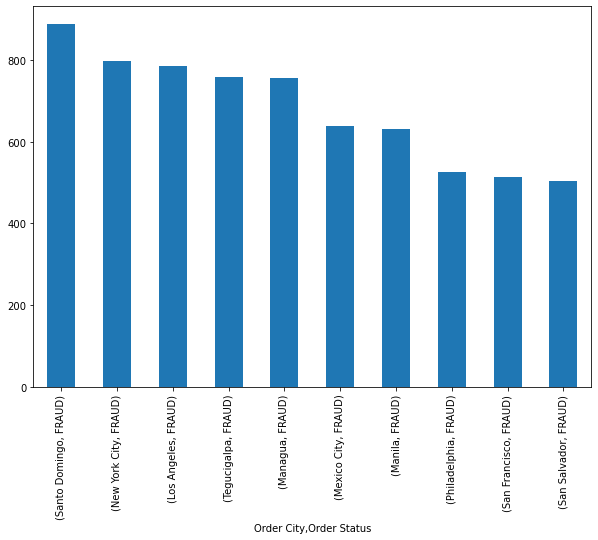

In [66]:
fraud_dataset.groupby('Order City')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above output shows the top 10 cities where fraudulant orders are placed from.

Lets work with the order date now, to check which year,months there is lot of fradulant activity

In [67]:
dataset['order date (DateOrders)'] = pd.to_datetime(dataset['order date (DateOrders)'])

In [68]:
dataset['order month'] = pd.DatetimeIndex(dataset['order date (DateOrders)']).month
dataset['order year'] = pd.DatetimeIndex(dataset['order date (DateOrders)']).year
dataset['order date'] = pd.DatetimeIndex(dataset['order date (DateOrders)']).day
dataset['order day'] = pd.DatetimeIndex(dataset['order date (DateOrders)']).dayofweek

In [69]:
fraud_dataset = dataset[dataset['Order Status']=='FRAUD']

In [70]:
fraud_dataset.groupby('order year')['Order Status'].value_counts().sort_values(ascending=False)

order year  Order Status
2015        FRAUD           26389
2016        FRAUD           26015
2017        FRAUD           22544
2018        FRAUD             870
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='order year,Order Status'>

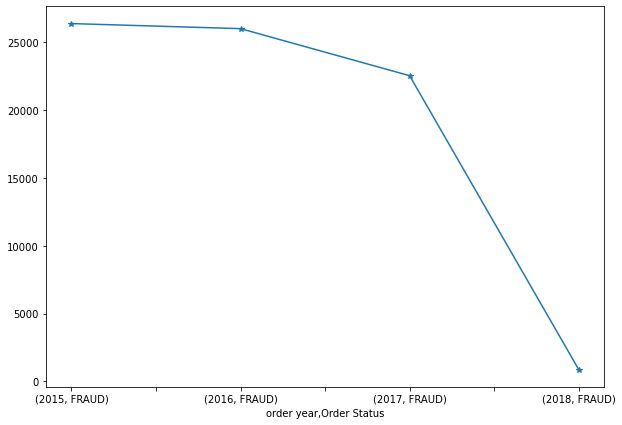

In [71]:
fraud_dataset.groupby('order year')['Order Status'].value_counts().sort_values(ascending=False).plot(kind='line',figsize=(10,7),marker='*')

The above plot shows the number of fraudulant activities for each year in the dataset

In [72]:
fraud_dataset.groupby('order month')['Order Status'].value_counts(ascending=False)

order month  Order Status
1            FRAUD           7725
2            FRAUD           6056
3            FRAUD           6788
4            FRAUD           6487
5            FRAUD           6540
6            FRAUD           6277
7            FRAUD           6808
8            FRAUD           6655
9            FRAUD           6334
10           FRAUD           5473
11           FRAUD           5215
12           FRAUD           5460
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='order month,Order Status'>

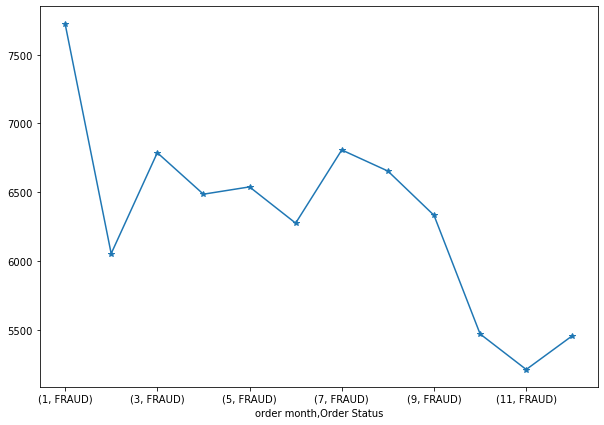

In [73]:
fraud_dataset.groupby('order month')['Order Status'].value_counts(ascending=False).plot(kind='line',figsize=(10,7),marker='*')

The above plot shows the trend in fradulant activity for each month, we see that most of the fradulant activity happens in January and July 

In [74]:
fraud_dataset.groupby('order date')['Order Status'].value_counts(ascending=False).head(30)

order date  Order Status
1           FRAUD           2344
2           FRAUD           2511
3           FRAUD           2667
4           FRAUD           2371
5           FRAUD           2524
6           FRAUD           2522
7           FRAUD           2538
8           FRAUD           2488
9           FRAUD           2487
10          FRAUD           2511
11          FRAUD           2441
12          FRAUD           2483
13          FRAUD           2518
14          FRAUD           2462
15          FRAUD           2549
16          FRAUD           2384
17          FRAUD           2472
18          FRAUD           2659
19          FRAUD           2498
20          FRAUD           2459
21          FRAUD           2501
22          FRAUD           2505
23          FRAUD           2426
24          FRAUD           2430
25          FRAUD           2496
26          FRAUD           2384
27          FRAUD           2466
28          FRAUD           2568
29          FRAUD           2492
30          FRAUD 

<AxesSubplot:xlabel='order date,Order Status'>

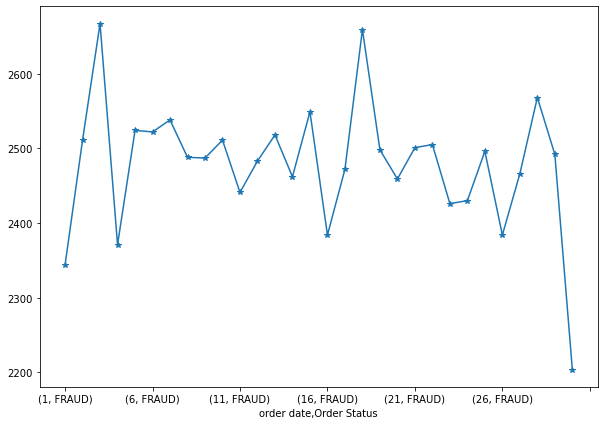

In [75]:
fraud_dataset.groupby('order date')['Order Status'].value_counts(ascending=False).head(30).plot(kind='line',figsize=(10,7),marker='*')

From the above plot we see the trend in fraud orders placed based on dates, no clear visual from this

In [76]:
fraud_dataset.groupby('order day')['Order Status'].value_counts(ascending=False).head(30)

order day  Order Status
0          FRAUD           10821
1          FRAUD           10702
2          FRAUD           10875
3          FRAUD           10739
4          FRAUD           10925
5          FRAUD           10957
6          FRAUD           10799
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='order day,Order Status'>

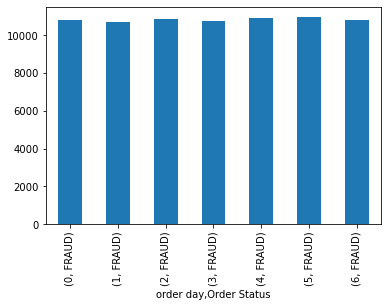

In [77]:
fraud_dataset.groupby('order day')['Order Status'].value_counts(ascending=False).head(30).plot(kind='bar')

From the above plot clearly visible fraudsters have no specific day to place fraud orders

In [78]:
fraud_dataset.groupby('Order Region')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Order Region     Order Status
Central America  FRAUD           11818
Western Europe   FRAUD           11679
South America    FRAUD            6373
Oceania          FRAUD            4299
Southeast Asia   FRAUD            4161
Northern Europe  FRAUD            3947
Southern Europe  FRAUD            3937
Caribbean        FRAUD            3451
South Asia       FRAUD            3315
West of USA      FRAUD            3251
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Order Region,Order Status'>

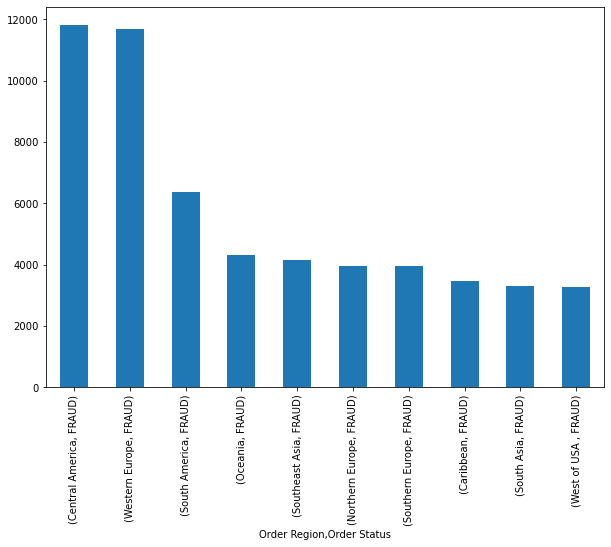

In [79]:
fraud_dataset.groupby('Order Region')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above plot shows the top 10 order regions where fradulant activities happen

In [80]:
fraud_dataset.groupby('Department Name')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Department Name  Order Status
Fan Shop         FRAUD           28257
Apparel          FRAUD           20619
Golf             FRAUD           13910
Footwear         FRAUD            6057
Outdoors         FRAUD            3986
Fitness          FRAUD            1051
Discs Shop       FRAUD             847
Technology       FRAUD             578
Pet Shop         FRAUD             197
Book Shop        FRAUD             182
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Department Name,Order Status'>

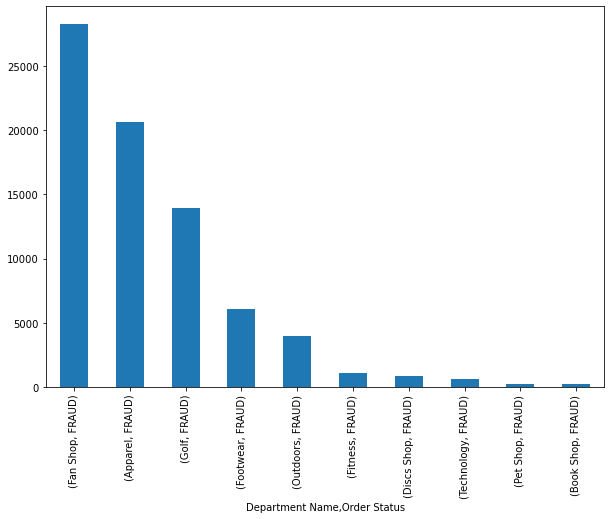

In [81]:
fraud_dataset.groupby('Department Name')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above plot shows the top 10 department names which have high fradulant orders.

In [82]:
fraud_dataset.groupby('Product Name')['Order Status'].value_counts().sort_values(ascending=False).head(10)

Product Name                                   Order Status
Perfect Fitness Perfect Rip Deck               FRAUD           10356
Nike Men's CJ Elite 2 TD Football Cleat        FRAUD            9310
Nike Men's Dri-FIT Victory Golf Polo           FRAUD            8842
O'Brien Men's Neoprene Life Vest               FRAUD            8236
Field & Stream Sportsman 16 Gun Fire Safe      FRAUD            7325
Pelican Sunstream 100 Kayak                    FRAUD            6519
Diamondback Women's Serene Classic Comfort Bi  FRAUD            5739
Nike Men's Free 5.0+ Running Shoe              FRAUD            5029
Under Armour Girls' Toddler Spine Surge Runni  FRAUD            4409
Fighting video games                           FRAUD             355
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Product Name,Order Status'>

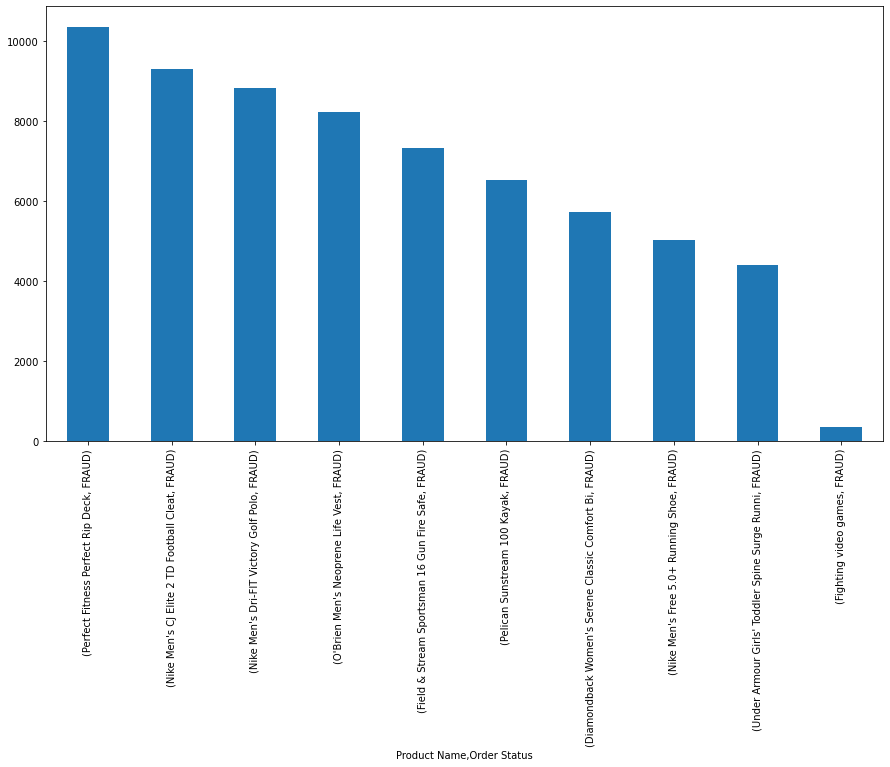

In [83]:
fraud_dataset.groupby('Product Name')['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(15,8))

The Above plot shows the top 10 product names that fraudsters try to buy

In [84]:
fraud_dataset.groupby('Shipping Mode')['Order Status'].value_counts().sort_values(ascending=False)

Shipping Mode   Order Status
Standard Class  FRAUD           45407
Second Class    FRAUD           14853
First Class     FRAUD           11503
Same Day        FRAUD            4055
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Shipping Mode,Order Status'>

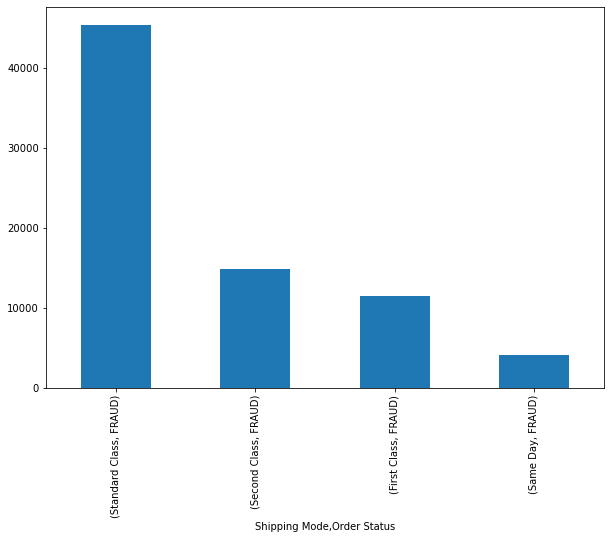

In [85]:
fraud_dataset.groupby('Shipping Mode')['Order Status'].value_counts().sort_values(ascending=False).plot(kind='bar',figsize=(10,7))

From the above plot it means that when Fraudsters order something they tend to go with Standard Class of shipping

In [86]:
fraud_dataset.groupby(['Order Region','Department Name'])['Order Status'].value_counts().sort_values(ascending=False).head(10)

Order Region     Department Name  Order Status
Central America  Fan Shop         FRAUD           4665
Western Europe   Fan Shop         FRAUD           4184
                 Apparel          FRAUD           3185
Central America  Apparel          FRAUD           3161
South America    Fan Shop         FRAUD           2541
Central America  Golf             FRAUD           2262
Western Europe   Golf             FRAUD           2200
South America    Apparel          FRAUD           1618
Oceania          Fan Shop         FRAUD           1496
Southern Europe  Fan Shop         FRAUD           1450
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Order Region,Department Name,Order Status'>

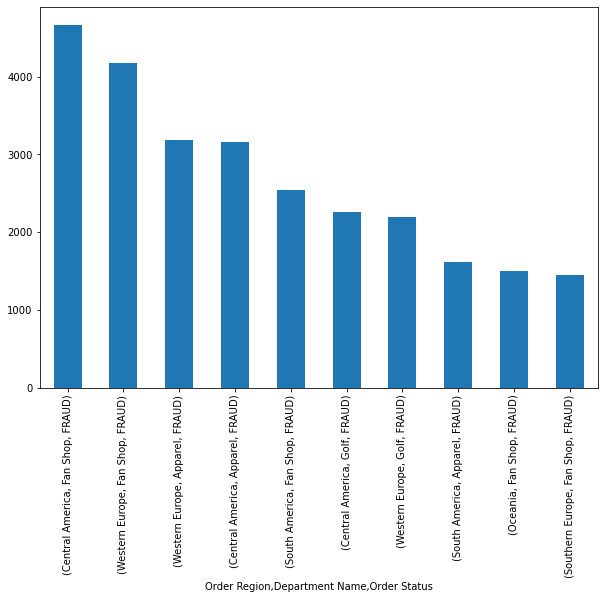

In [87]:
fraud_dataset.groupby(['Order Region','Department Name'])['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above plot shows the top 10 departments effected to fraud acros all the regions.

In [88]:
fraud_dataset.groupby(['Department Name','Product Name'])['Order Status'].value_counts().sort_values(ascending=False).head(10)

Department Name  Product Name                                   Order Status
Apparel          Perfect Fitness Perfect Rip Deck               FRAUD           10356
                 Nike Men's CJ Elite 2 TD Football Cleat        FRAUD            9310
Golf             Nike Men's Dri-FIT Victory Golf Polo           FRAUD            8842
Fan Shop         O'Brien Men's Neoprene Life Vest               FRAUD            8236
                 Field & Stream Sportsman 16 Gun Fire Safe      FRAUD            7325
                 Pelican Sunstream 100 Kayak                    FRAUD            6519
                 Diamondback Women's Serene Classic Comfort Bi  FRAUD            5739
Footwear         Nike Men's Free 5.0+ Running Shoe              FRAUD            5029
Golf             Under Armour Girls' Toddler Spine Surge Runni  FRAUD            4409
Discs Shop       Fighting video games                           FRAUD             355
Name: Order Status, dtype: int64

<AxesSubplot:xlabel='Department Name,Product Name,Order Status'>

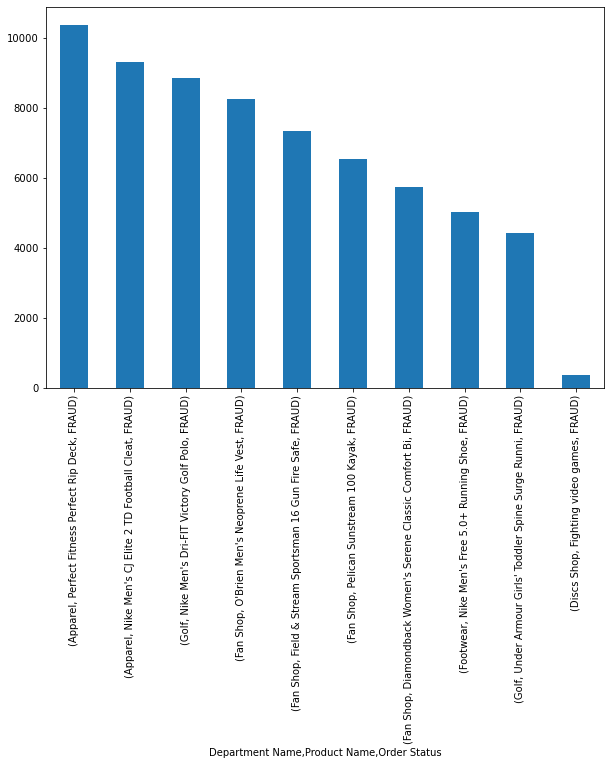

In [89]:
fraud_dataset.groupby(['Department Name','Product Name'])['Order Status'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar',figsize=(10,7))

The above plot shows the top 10 products across all the department that are subjected to fraud

In [90]:
dataset.select_dtypes(include=[np.number]).columns

Index(['Benefit per order', 'Sales per customer', 'Category Id', 'Customer Id',
       'Department Id', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Product Card Id', 'Product Category Id',
       'Product Price', 'order month', 'order year', 'order date',
       'order day'],
      dtype='object')

In [91]:
dataset.select_dtypes(include=[np.object]).columns

Index(['Type', 'Delivery Status', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Segment', 'Customer State',
       'Customer Street', 'Department Name', 'Market', 'Order City',
       'Order Country', 'Order Region', 'Order State', 'Order Status',
       'Product Name', 'Shipping Mode', 'Order Shipment'],
      dtype='object')

We will be dropping the order date column now as we have extracted the year,month and date from it

In [92]:
dataset.drop('order date (DateOrders)',axis=1,inplace=True)

##### Checking the presence of outliers in the dataset

We will be checking the presence of outliers by using the IQR technique

In [93]:
print('Before removing the outliers this is the shape of the data number of rows {} and number of columns {}'.format(dataset.shape[0],dataset.shape[1]))

Before removing the outliers this is the shape of the data number of rows 180519 and number of columns 41


In [94]:
dataset1 = dataset

In [95]:
n = dataset1.shape[0]

First lets check the number of outliers in each column:

In [96]:
q1 = dataset1.quantile(0.25)
q3 = dataset1.quantile(0.75)
iqr = q3 - q1
ul = q3 + 1.5*iqr
ll = q1 - 1.5*iqr

In [97]:
print('Below is a table that tells us the percentage of outliers for each column\n\n',(((dataset1 < (ll)) | (dataset1 > (ul))).sum()/len(dataset1))*100)

Below is a table that tells us the percentage of outliers for each column

 Benefit per order           10.493078
Category Id                  0.000000
Category Name                0.000000
Customer City                0.000000
Customer Country             0.000000
Customer Id                  0.663642
Customer Segment             0.000000
Customer State               0.000000
Customer Street              0.000000
Delivery Status              0.000000
Department Id                0.200533
Department Name              0.000000
Market                       0.000000
Order City                   0.000000
Order Country                0.000000
Order Customer Id            0.663642
Order Id                     0.000000
Order Item Cardprod Id       0.000000
Order Item Discount          4.175184
Order Item Discount Rate     0.000000
Order Item Id                0.000000
Order Item Product Price     1.134507
Order Item Profit Ratio      9.583479
Order Item Quantity          0.000000
Order Item T

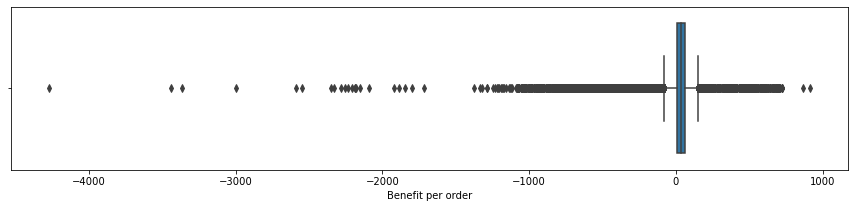

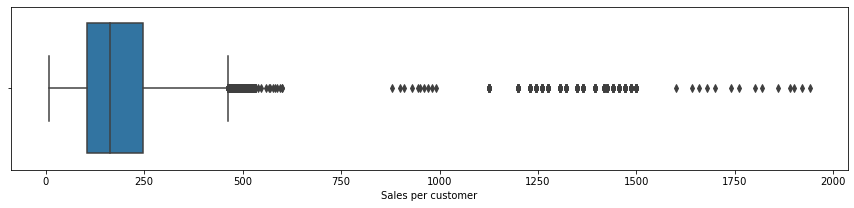

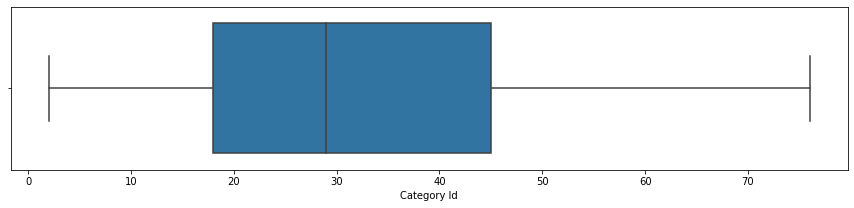

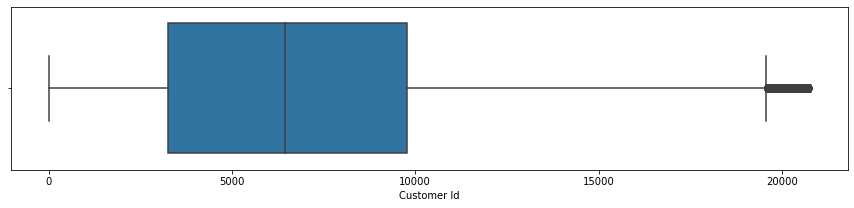

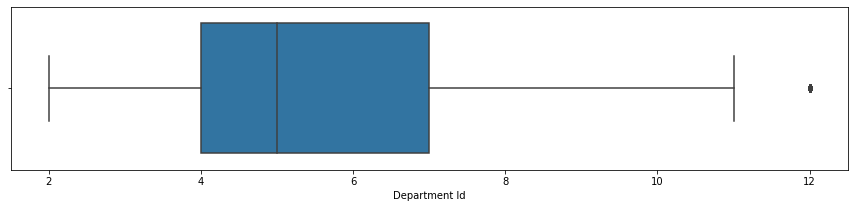

...

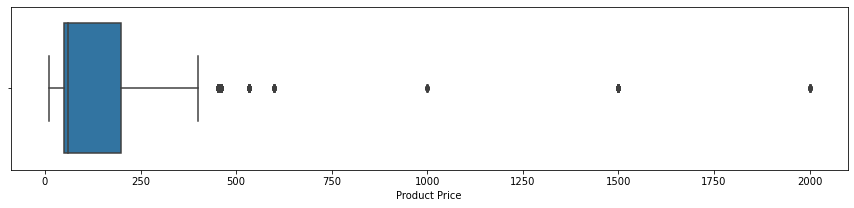

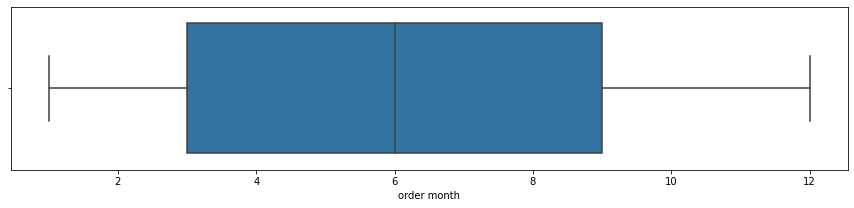

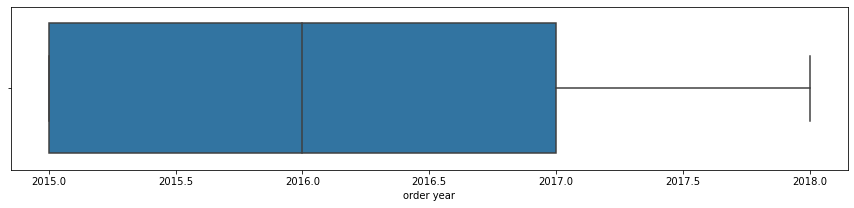

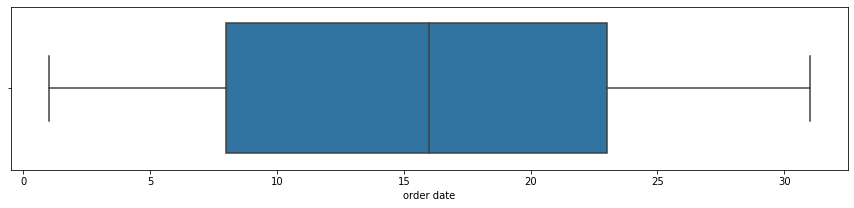

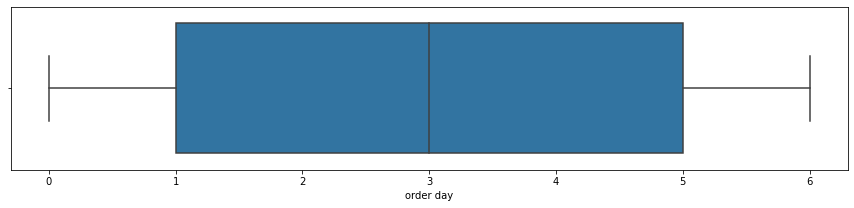

In [98]:
for col in dataset1.select_dtypes(include=[np.number]):
    plt.figure(figsize=(15,3))
    sns.boxplot(dataset1[col])
    plt.show()

In [99]:
dataset1 = dataset1[~((dataset1 < (ll)) |(dataset1 > (ul))).any(axis=1)]

In [100]:
dataset1.shape

(149105, 41)

In [101]:
print('After removing the outliers the shape of the dataset is Number of rows {} and number of columns {}'.format(dataset1.shape[0],dataset1.shape[1]))

After removing the outliers the shape of the dataset is Number of rows 149105 and number of columns 41


In [102]:
n1 = dataset1.shape[0]

Chcking the Loss of data

In [103]:
print('% of loss of data from the origianl data set is: ',((n-n1)/n)*100)

% of loss of data from the origianl data set is:  17.402046321993804


###### Since the percentage of removal is very high we will not be removing the outliers from the origianl dataset as data loss is very high

In [104]:
dataset.select_dtypes(include=[np.number]).columns

Index(['Benefit per order', 'Sales per customer', 'Category Id', 'Customer Id',
       'Department Id', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Product Card Id', 'Product Category Id',
       'Product Price', 'order month', 'order year', 'order date',
       'order day'],
      dtype='object')

In [105]:
num_col_df = dataset[['Benefit per order', 'Sales per customer','Order Item Discount','Order Item Discount Rate',
                     'Order Item Product Price','Order Item Profit Ratio', 'Order Item Quantity', 'Sales','Order Item Total',
                     'Product Price', 'order month', 'order year', 'order date','order day']]

##### Checking Multi-collinearity in the data and  Multi-Variate Analysis

In [106]:
corr = num_col_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

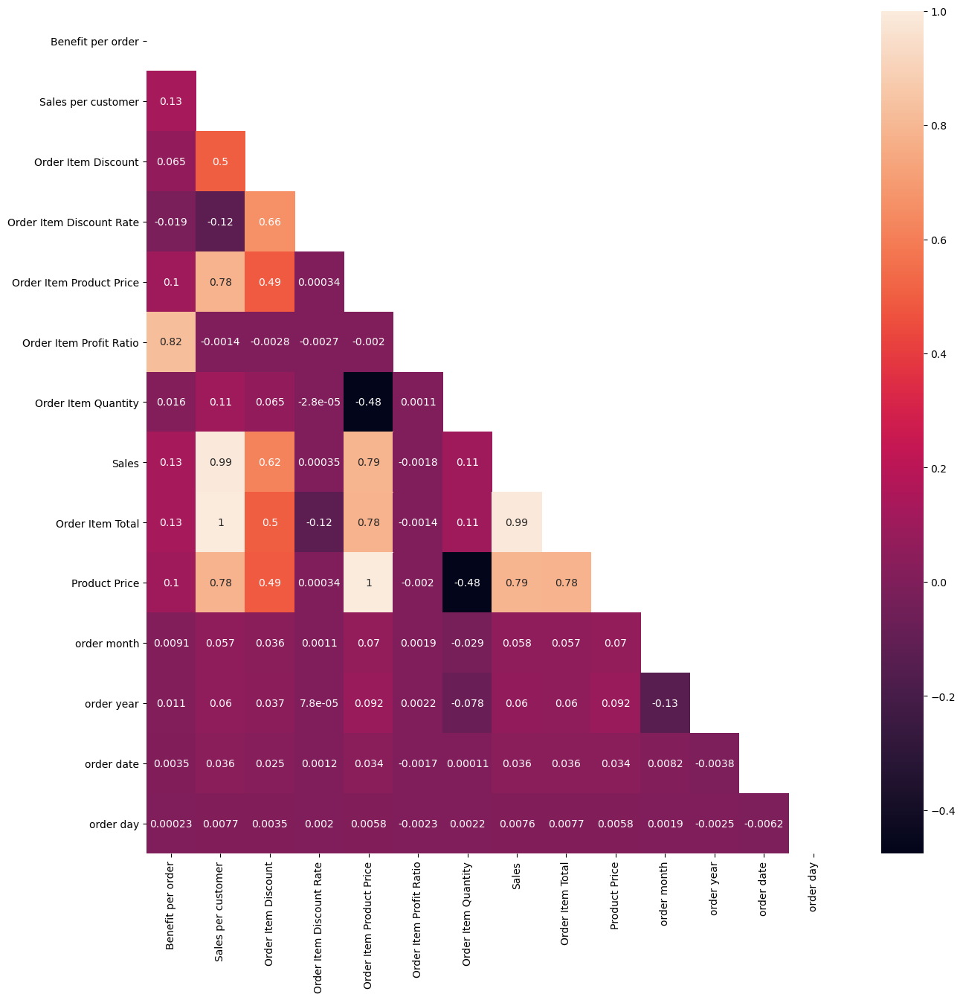

In [107]:
plt.figure(figsize=(15,15),dpi=100)
sns.heatmap(corr,mask=mask,annot=True)
plt.show()

There is Multi-Colinearity present in the dataset we will remove the same using VIF.

In [112]:
dataset_feature = dataset.drop('Order Status',axis=1)
dataset_target = dataset['Order Status']

In [113]:
dataset.select_dtypes(include=[np.number]).columns

Index(['Benefit per order', 'Sales per customer', 'Category Id', 'Customer Id',
       'Department Id', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Product Card Id', 'Product Category Id',
       'Product Price', 'order month', 'order year', 'order date',
       'order day'],
      dtype='object')

In [114]:
dataset_feature = dataset.drop(['Category Id', 'Customer Id',
       'Department Id', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id','Order Item Id','Product Card Id', 'Product Category Id'],axis=1)

In [115]:
df_numeric_features_vif = dataset_feature.select_dtypes(include=[np.number])
df_numeric_features_vif.head()

,Benefit per order,Sales per customer,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Product Price,order month,order year,order date,order day
0,91.250000,314.640015,13.110000,0.04,327.75,0.29,1,327.75,314.640015,327.75,1,2018,31,2
1,-249.089996,311.359985,16.389999,0.05,327.75,-0.80,1,327.75,311.359985,327.75,1,2018,13,5
2,-247.779999,309.720001,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,327.75,1,2018,13,5
3,22.860001,304.809998,22.940001,0.07,327.75,0.08,1,327.75,304.809998,327.75,1,2018,13,5
4,134.210007,298.250000,29.500000,0.09,327.75,0.45,1,327.75,298.250000,327.75,1,2018,13,5


Calculating the VIF for each numeric variable.

In [116]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(df_numeric_features_vif.values, i) for i in range(df_numeric_features_vif.shape[1])]
vif["Features"] = df_numeric_features_vif.columns
vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

,VIF_Factor,Features
0,inf,Sales per customer
1,inf,Order Item Product Price
2,inf,Order Item Total
3,inf,Product Price
4,2.550899e+10,Sales
5,3.899806e+08,Order Item Discount
6,2.531794e+01,order year
7,2.048312e+01,Order Item Quantity
8,1.042247e+01,Order Item Discount Rate
9,4.377597e+00,order month


 Now, we use the for loop to find VIF and remove the variables with VIF greater than 10. We set the threshold to 10, as we wish to remove the variable for which the remaining variables explain more than 90% of the variation. One can choose the threshold other than 10. (it depends on the business requirements)

In [117]:
for ind in range(len(df_numeric_features_vif.columns)):
    vif = pd.DataFrame()
    vif["VIF_Factor"] = [variance_inflation_factor(df_numeric_features_vif.values, i) for i in range(df_numeric_features_vif.shape[1])]
    vif["Features"] = df_numeric_features_vif.columns
    multi = vif[vif['VIF_Factor'] > 10]
    if(multi.empty == False):
        df_sorted = multi.sort_values(by = 'VIF_Factor', ascending = False)
    else:
        print(vif)
        break
    if (df_sorted.empty == False):
        df_numeric_features_vif = df_numeric_features_vif.drop(df_sorted.Features.iloc[0], axis=1)
    else:
        print(vif)

   VIF_Factor                  Features
0    3.400452         Benefit per order
1    6.326446       Order Item Discount
2    5.936406  Order Item Discount Rate
3    3.406664   Order Item Profit Ratio
4    3.426027       Order Item Quantity
5    4.076172             Product Price
6    3.845843               order month
7    3.692062                order date
8    2.971331                 order day


In [118]:
df_numeric_features_vif.head()

,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Product Price,order month,order date,order day
0,91.250000,13.110000,0.04,0.29,1,327.75,1,31,2
1,-249.089996,16.389999,0.05,-0.80,1,327.75,1,13,5
2,-247.779999,18.030001,0.06,-0.80,1,327.75,1,13,5
3,22.860001,22.940001,0.07,0.08,1,327.75,1,13,5
4,134.210007,29.500000,0.09,0.45,1,327.75,1,13,5


 Now, we have all the variables with VIF less than 10. So, we can conclude that there is no multicollinearity in the data.
We will use the above dataframe "df_numeric_features_vif" to build the model with significant variables.

In [119]:
df_numeric_features_vif.shape

(180519, 9)

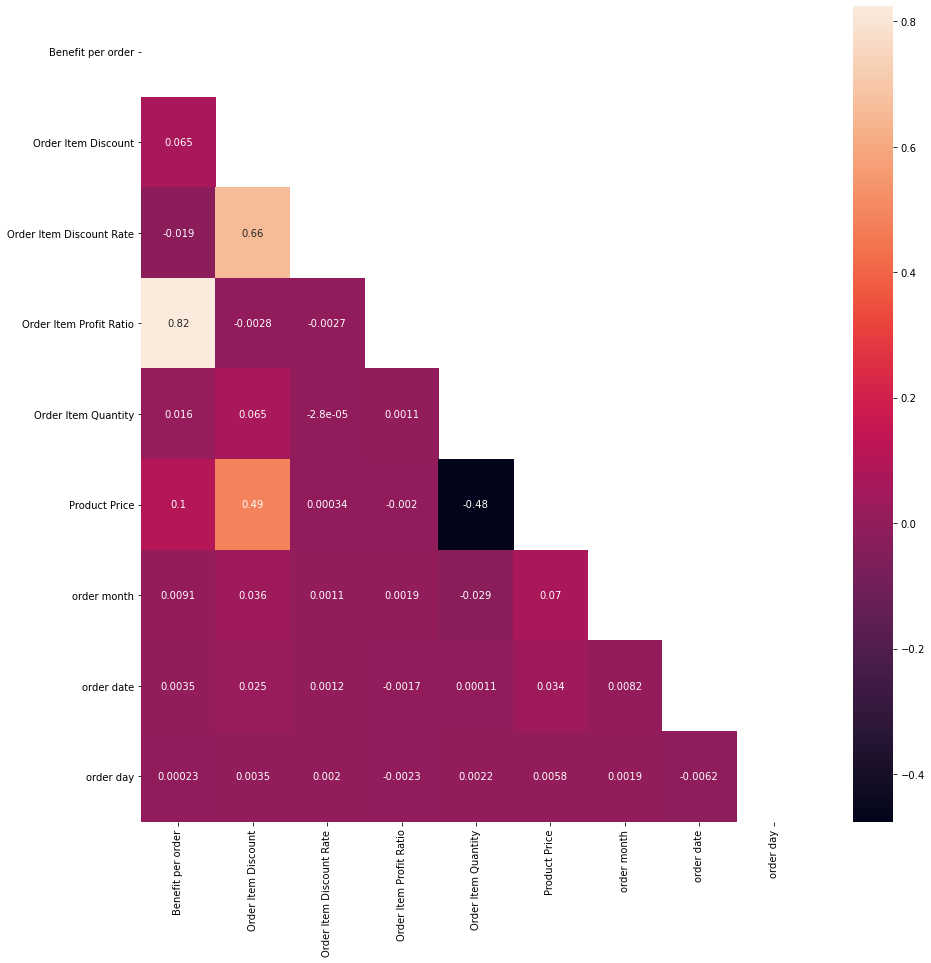

In [120]:
plt.figure(figsize=(15,15))
sns.heatmap(df_numeric_features_vif.corr(),mask = np.triu(np.ones_like(df_numeric_features_vif.corr(), dtype=bool)),annot=True)
plt.show()

##### Checking the Assumptions for the model.

Assumption 1:

The target variable i.e, Order Status is a categorical variable.

In [121]:
print('The datatype of Order Status column is:{} and it has {} categories.'.format(dataset_target.dtype,dataset_target.nunique()))

The datatype of Order Status column is:object and it has 2 categories.


Assumption 2:

As shown in the above heatmap we have removed the multicolinearity from all the numeric columns of the dataset

##### Final model details

In [122]:
print('The total number of continuous columns now that can be used in the dataset are: {}\nThe total number of categorical columns that can be used in the dataset are {}'.format(len(df_numeric_features_vif.columns),len(dataset.select_dtypes(include=[np.object]).columns)))

The total number of continuous columns now that can be used in the dataset are: 9
The total number of categorical columns that can be used in the dataset are 18


lets go ahead and combine the data now, so that we can proceed further with the model

Now creating a new dataset with the selected numerical values and all the selected categorical columns

Histogram of numeric features

In [123]:
num_clms = df_numeric_features_vif.columns

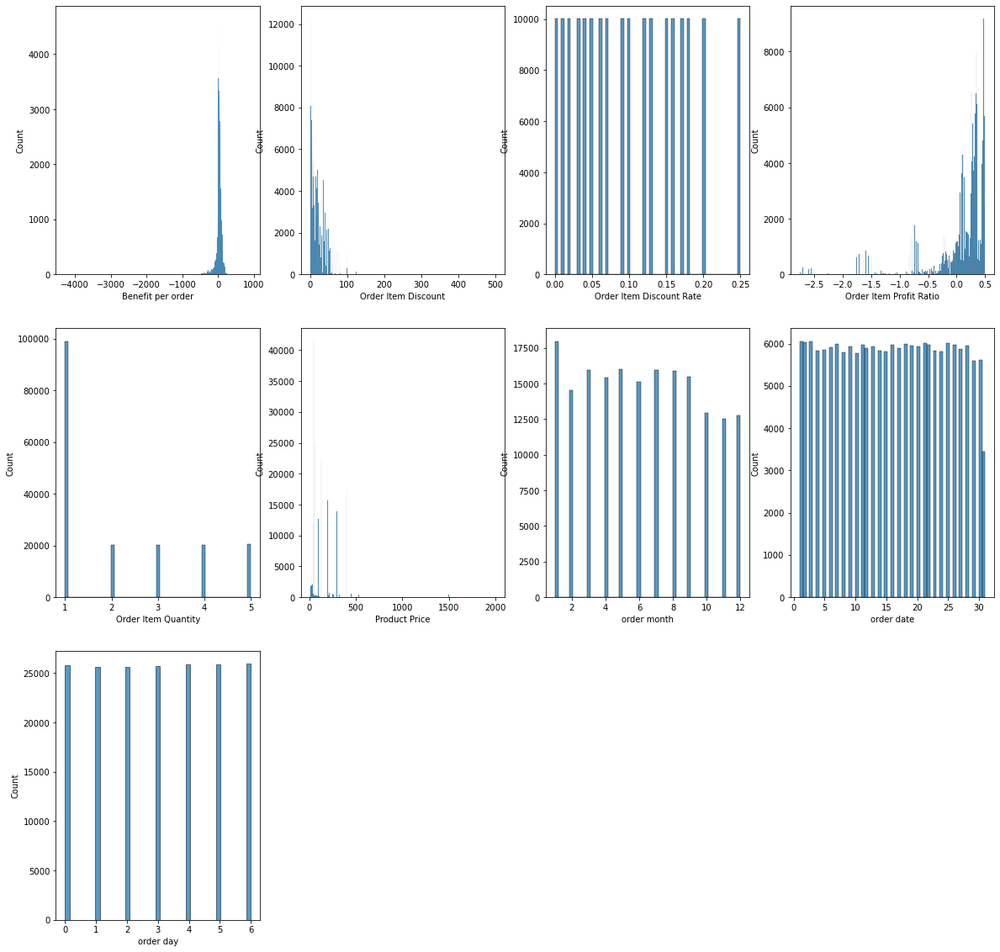

In [124]:
a = len(df_numeric_features_vif.columns)/3
b = 4
c = 1


fig = plt.figure(figsize=(20,20))

for i in df_numeric_features_vif.columns:
    plt.subplot(a, b, c)
    sns.histplot(df_numeric_features_vif[i])
    c = c + 1

plt.show()

In [125]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
pt.fit(df_numeric_features_vif)
df_numeric_features_vif = pt.transform(df_numeric_features_vif)
df_numeric_features_vif = pd.DataFrame(df_numeric_features_vif,columns=num_clms)
df_numeric_features_vif.head()

,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Product Price,order month,order date,order day
0,0.892824,-0.034047,-0.870368,0.231270,-0.87391,1.375277,-1.68791,1.588835,-0.427075
1,-1.875511,0.164443,-0.699316,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836
2,-1.869528,0.252583,-0.533545,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836
3,-0.257417,0.484273,-0.372845,-0.640242,-0.87391,1.375277,-1.68791,-0.224562,0.981836
4,1.690495,0.740356,-0.065867,1.216647,-0.87391,1.375277,-1.68791,-0.224562,0.981836


Histogram after power transformation

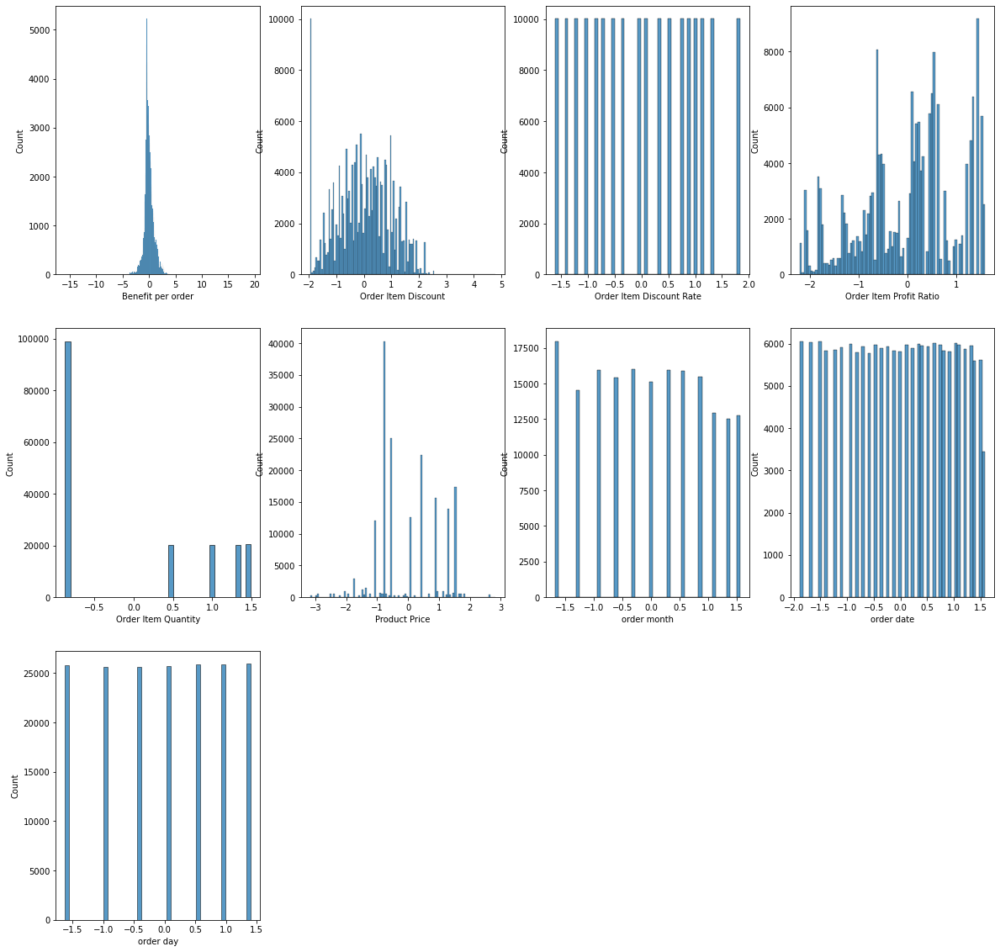

In [126]:
a = len(df_numeric_features_vif.columns)/3
b = 4
c = 1


fig = plt.figure(figsize=(20,20))

for i in df_numeric_features_vif.columns:
    plt.subplot(a, b, c)
    sns.histplot(df_numeric_features_vif[i])
    c = c + 1

plt.show()

In [127]:
df = pd.concat([df_numeric_features_vif,dataset.select_dtypes(include=[np.object])],axis=1).reset_index(drop=True)

In [128]:
df.head()

,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Product Price,order month,order date,order day,Type,...,Department Name,Market,Order City,Order Country,Order Region,Order State,Order Status,Product Name,Shipping Mode,Order Shipment
0,0.892824,-0.034047,-0.870368,0.231270,-0.87391,1.375277,-1.68791,1.588835,-0.427075,DEBIT,...,Fitness,Pacific Asia,Bekasi,Indonesia,Southeast Asia,Java Occidental,NOT_FRAUD,Smart watch,Standard Class,BEFORE_TIME
1,-1.875511,0.164443,-0.699316,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836,TRANSFER,...,Fitness,Pacific Asia,Bikaner,India,South Asia,Rajastán,FRAUD,Smart watch,Standard Class,DELAY
2,-1.869528,0.252583,-0.533545,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836,CASH,...,Fitness,Pacific Asia,Bikaner,India,South Asia,Rajastán,NOT_FRAUD,Smart watch,Standard Class,ON_TIME
3,-0.257417,0.484273,-0.372845,-0.640242,-0.87391,1.375277,-1.68791,-0.224562,0.981836,DEBIT,...,Fitness,Pacific Asia,Townsville,Australia,Oceania,Queensland,NOT_FRAUD,Smart watch,Standard Class,BEFORE_TIME
4,1.690495,0.740356,-0.065867,1.216647,-0.87391,1.375277,-1.68791,-0.224562,0.981836,PAYMENT,...,Fitness,Pacific Asia,Townsville,Australia,Oceania,Queensland,FRAUD,Smart watch,Standard Class,BEFORE_TIME


In [129]:
df1 = df

In [130]:
df1.rename(columns={'Order Status':'OrderStatus'},inplace = True)

In [131]:
df1['fraud'] = np.where(df1['OrderStatus'] == 'FRAUD', 1, 0)

In [132]:
df1.drop('OrderStatus',axis=1,inplace=True)

labelEncoding all the categorical columns:

In [133]:
le = LabelEncoder()

In [134]:
for col in df1.select_dtypes(include=[np.object]):
    df1[col] = le.fit_transform(df1[col])

##### Statistically checking the significance

In [135]:
df_constant = add_constant(df1)
df_constant.head()

,const,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Product Price,order month,order date,order day,...,Department Name,Market,Order City,Order Country,Order Region,Order State,Product Name,Shipping Mode,Order Shipment,fraud
0,1.0,0.892824,-0.034047,-0.870368,0.231270,-0.87391,1.375277,-1.68791,1.588835,-0.427075,...,4,3,331,70,15,475,78,3,0,0
1,1.0,-1.875511,0.164443,-0.699316,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836,...,4,3,391,69,13,841,78,3,1,1
2,1.0,-1.869528,0.252583,-0.533545,-1.822335,-0.87391,1.375277,-1.68791,-0.224562,0.981836,...,4,3,391,69,13,841,78,3,2,0
3,1.0,-0.257417,0.484273,-0.372845,-0.640242,-0.87391,1.375277,-1.68791,-0.224562,0.981836,...,4,3,3226,8,11,835,78,3,0,0
4,1.0,1.690495,0.740356,-0.065867,1.216647,-0.87391,1.375277,-1.68791,-0.224562,0.981836,...,4,3,3226,8,11,835,78,3,0,1


In [136]:
st.chisqprob = lambda chisq, df1: st.chi2.sf(chisq, df1)
cols=df_constant.columns[:-1]
model=sm.Logit(df1.fraud,df_constant[cols])
result=model.fit()
result.summary()


Optimization terminated successfully.
         Current function value: 0.574922
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  fraud   No. Observations:               180519
Model:                          Logit   Df Residuals:                   180492
Method:                           MLE   Df Model:                           26
Date:                Thu, 06 May 2021   Pseudo R-squ.:                  0.1549
Time:                        14:11:00   Log-Likelihood:            -1.0378e+05
converged:                       True   LL-Null:                   -1.2281e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.3412      0.042    -56.039      0.000      -2.423      -2.259
Benefit per order           -0.0159      0.009     -1.746      0.081      -0.034       0.002
Order Item Discount          0.0099      0.018      0.564      0.573      -0.024       0.044
Order Item Discount Rate    -0.0112      0.015     -0.749      0.454      -0.041       0.018
Order Item Profit Ratio      0.0020      0.008      0.236      0.813      -0.014       0.018
Order Item Quantity          0.0010      0.011      0.096      0.923      -0.020       0.022
Product Price               -0.0095      0.014     -0.684      0.494      -0.037       0.018
order month                 -0.0105      0.006     -1.789      0.074      -0.022       0.001
order date                   0.0030      0.005      0.558      0.577      -0.007       0.013
order day                   -0.0019      0.005     -0.365      0.715      -0.012       0.009
Type                         1.0475      0.006    175.644      0.000       1.036       1.059
Delivery Status             -0.3170      0.015    -20.876      0.000      -0.347      -0.287
Category Name                0.0006      0.000      1.354      0.176      -0.000       0.001
Customer City               -0.0001   4.11e-05     -2.780      0.005      -0.000   -3.37e-05
Customer Country            -0.0316      0.015     -2.045      0.041      -0.062      -0.001
Customer Segment            -0.0210      0.007     -3.002      0.003      -0.035      -0.007
Customer State               0.0012      0.001      2.350      0.019       0.000       0.002
Customer Street          -1.011e-06   2.48e-06     -0.408      0.683   -5.87e-06    3.85e-06
Department Name             -0.0061      0.002     -2.590      0.010      -0.011      -0.001
Market                       0.0018      0.005      0.366      0.715      -0.008       0.011
Order City                2.327e-05   5.49e-06      4.237      0.000    1.25e-05     3.4e-05
Order Country            -3.461e-05      0.000     -0.255      0.799      -0.000       0.000
Order Region                 0.0044      0.001      5.057      0.000       0.003       0.006
Order State              -2.634e-05   1.82e-05     -1.451      0.147   -6.19e-05    9.25e-06
Product Name                -0.0004      0.000     -1.567      0.117      -0.001       0.000
Shipping Mode                0.0417      0.005      8.144      0.000       0.032       0.052
Order Shipment               0.4565      0.023     19.744      0.000       0.411       0.502
============================================================================================
"""

##### Feature Selection: Backward elemination (P-value approach)

In [137]:
def back_feature_elem (data_frame,dep_var,col_list):
    """ Takes in the dataframe, the dependent variable and a list of column names, runs the regression repeatedly eliminating feature with the highest
    P-value above alpha one at a time and returns the regression summary with all p-values below alpha"""

    while len(col_list)>0 :
        model=sm.Logit(dep_var,data_frame[col_list])
        result=model.fit(disp=0)
        largest_pvalue=round(result.pvalues,3).nlargest(1)
        if largest_pvalue[0]<(0.05):
            return result
            break
        else:
            col_list=col_list.drop(largest_pvalue.index)

result=back_feature_elem(df_constant,df1.fraud,cols)

In [138]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  fraud   No. Observations:               180519
Model:                          Logit   Df Residuals:                   180506
Method:                           MLE   Df Model:                           12
Date:                Thu, 06 May 2021   Pseudo R-squ.:                  0.1548
Time:                        14:11:11   Log-Likelihood:            -1.0379e+05
converged:                       True   LL-Null:                   -1.2281e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -2.3656      0.031    -76.205      0.000      -2.426      -2.305
Benefit per order    -0.0145      0.005     -2.709      0.007      -0.025      -0.004
Type                  1.0475      0.006    175.664      0.000       1.036       1.059
Delivery Status      -0.3168      0.015    -20.865      0.000      -0.347      -0.287
Customer City        -0.0001   4.11e-05     -2.777      0.005      -0.000   -3.36e-05
Customer Country     -0.0318      0.015     -2.056      0.040      -0.062      -0.001
Customer Segment     -0.0211      0.007     -3.012      0.003      -0.035      -0.007
Customer State        0.0012      0.001      2.348      0.019       0.000       0.002
Department Name      -0.0047      0.002     -2.199      0.028      -0.009      -0.001
Order City          2.19e-05   5.35e-06      4.097      0.000    1.14e-05    3.24e-05
Order Region          0.0040      0.001      5.146      0.000       0.002       0.005
Shipping Mode         0.0418      0.005      8.155      0.000       0.032       0.052
Order Shipment        0.4562      0.023     19.734      0.000       0.411       0.502
=====================================================================================
"""

##### Interpreting the results

In [139]:
params = np.exp(result.params)
conf = np.exp(result.conf_int())
conf['OR'] = params
pvalue=round(result.pvalues,3)
conf['pvalue']=pvalue
conf.columns = ['CI 95%(2.5%)', 'CI 95%(97.5%)', 'Odds Ratio','pvalue']
print ((conf))


                   CI 95%(2.5%)  CI 95%(97.5%)  Odds Ratio  pvalue
const                  0.088350       0.099783    0.093893   0.000
Benefit per order      0.975336       0.995999    0.985613   0.007
Type                   2.817414       2.884047    2.850536   0.000
Delivery Status        0.707098       0.750464    0.728458   0.000
Customer City          0.999805       0.999966    0.999886   0.005
Customer Country       0.939820       0.998519    0.968725   0.040
Customer Segment       0.965829       0.992672    0.979158   0.003
Customer State         1.000199       1.002205    1.001201   0.019
Department Name        0.991177       0.999492    0.995325   0.028
Order City             1.000011       1.000032    1.000022   0.000
Order Region           1.002453       1.005480    1.003966   0.000
Shipping Mode          1.032231       1.053161    1.042644   0.000
Order Shipment         1.508176       1.651231    1.578084   0.000


The below features which are listed pass the hypothesis test where the p-value < 0.05 which mean they are signigicant.

In [140]:
params.index

Index(['const', 'Benefit per order', 'Type', 'Delivery Status',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Department Name', 'Order City', 'Order Region',
       'Shipping Mode', 'Order Shipment'],
      dtype='object')

In [141]:
df2 = df_constant[['const', 'Benefit per order', 'Type', 'Delivery Status',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Department Name', 'Order City', 'Order Region',
       'Shipping Mode', 'Order Shipment','fraud']]

In [142]:
x = df2.drop('fraud',axis=1)
y = df2['fraud']

In [143]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=5)

In [144]:
logreg=LogisticRegression()
logreg.fit(x_train,y_train)
y_pred=logreg.predict(x_test)

In [145]:
print('The accuracy of the base model is: ',accuracy_score(y_test,y_pred)*100)
print('The precision of the base model is: ',precision_score(y_test,y_pred)*100)
print('The re-call calue of the base mode is: ',recall_score(y_test,y_pred)*100)
print('The f1-score of the base model is: ',f1_score(y_test,y_pred)*100)

The accuracy of the base model is:  68.62028214786912
The precision of the base model is:  63.84083869430546
The re-call calue of the base mode is:  58.75104152962329
The f1-score of the base model is:  61.19028044213026


In [146]:
print('The classification report for the base model is:\n',classification_report(y_test,y_pred))

The classification report for the base model is:
               precision    recall  f1-score   support

           0       0.72      0.76      0.74     31353
           1       0.64      0.59      0.61     22803

    accuracy                           0.69     54156
   macro avg       0.68      0.67      0.67     54156
weighted avg       0.68      0.69      0.68     54156



<AxesSubplot:>

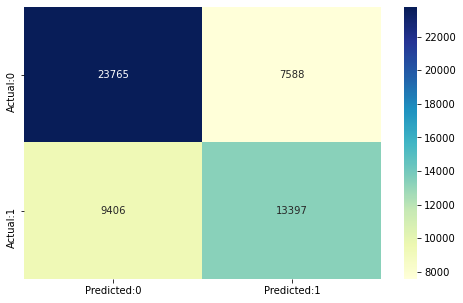

In [147]:
cm=confusion_matrix(y_test,y_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

In [148]:
TN=cm[0,0]
TP=cm[1,1]
FN=cm[1,0]
FP=cm[0,1]

In [150]:
print('True negative:',TN)
print('True Positive:',TP)
print('False Negative:',FN)
print('False Positive:',FP)

True negative: 23765
True Positive: 13397
False Negative: 9406
False Positive: 7588


In [151]:
sensitivity=TP/float(TP+FN)
specificity=TN/float(TN+FP)

In [152]:
print('The acuuracy of the model = TP+TN / (TP+TN+FP+FN) = ',(TP+TN)/float(TP+TN+FP+FN),'\n\n',

'The Miss-classification = 1-Accuracy = ',1-((TP+TN)/float(TP+TN+FP+FN)),'\n\n',

'Sensitivity or True Positive Rate = TP / (TP+FN) = ',TP/float(TP+FN),'\n\n',

'Specificity or True Negative Rate = TN / (TN+FP) = ',TN/float(TN+FP),'\n\n',

'Positive Predictive value = TP / (TP+FP) = ',TP/float(TP+FP),'\n\n',

'Negative predictive Value = TN / (TN+FN) = ',TN/float(TN+FN),'\n\n',

'Positive Likelihood Ratio = Sensitivity / (1-Specificity) = ',sensitivity/(1-specificity),'\n\n',

'Negative likelihood Ratio = (1-Sensitivity) / Specificity = ',(1-sensitivity)/specificity)


The acuuracy of the model = TP+TN / (TP+TN+FP+FN) =  0.6862028214786912 

 The Miss-classification = 1-Accuracy =  0.31379717852130884 

 Sensitivity or True Positive Rate = TP / (TP+FN) =  0.5875104152962329 

 Specificity or True Negative Rate = TN / (TN+FP) =  0.7579816923420406 

 Positive Predictive value = TP / (TP+FP) =  0.6384083869430546 

 Negative predictive Value = TN / (TN+FN) =  0.7164390582134997 

 Positive Likelihood Ratio = Sensitivity / (1-Specificity) =  2.427545341431575 

 Negative likelihood Ratio = (1-Sensitivity) / Specificity =  0.5441946538698594


###### From the above statistics it is clear that the model is highly specific than sensitive. The negative predicted values is better than the positive predicted values.

With the Base model we are getting a accuracy of 68% we can improve this with advanced Classification techniques with hyper parameter tuning.

###### -----------------------------------------End of Base model ---------------------------------------------

In [153]:
df = df2

In [154]:
df.head()

,const,Benefit per order,Type,Delivery Status,Customer City,Customer Country,Customer Segment,Customer State,Department Name,Order City,Order Region,Shipping Mode,Order Shipment,fraud
0,1.0,0.892824,1,0,66,1,0,36,4,331,15,3,0,0
1,1.0,-1.875511,3,1,66,1,0,36,4,391,13,3,1,1
2,1.0,-1.869528,0,3,452,0,0,5,4,391,13,3,2,0
3,1.0,-0.257417,1,0,285,0,2,5,4,3226,11,3,0,0
4,1.0,1.690495,2,0,66,1,1,36,4,3226,11,3,0,1


In [155]:
df['fraud'].value_counts(normalize=True)*100

0    57.999989
1    42.000011
Name: fraud, dtype: float64

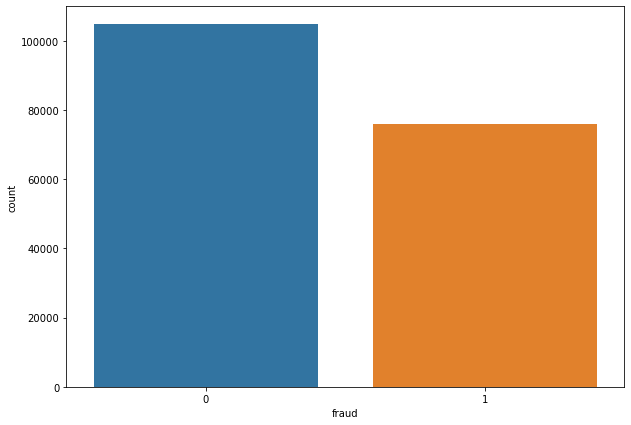

In [156]:
plt.figure(figsize=(10,7))
sns.countplot(df['fraud'])
plt.show()

###### This problem is not considerd as Class Imbalance.

We can proceed further with Complex models like KNN, Decision tree, Random Forest and Naive Bayes

In [157]:
X = df.drop('fraud',axis=1)
y = df['fraud']

In [158]:
X.shape

(180519, 13)

In [159]:
y.shape

(180519,)

In [160]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [161]:
X_train = ss.fit_transform(X_train)
X_test = ss.transform(X_test)

###### Function to display to model results

In [162]:
def model_eval(ytest,ypred):
    cm=confusion_matrix(ytest,ypred)
    conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
    plt.figure(figsize = (8,5))
    sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")
    plt.show()
    TN=cm[0,0]
    TP=cm[1,1]
    FN=cm[1,0]
    FP=cm[0,1]
    print('True negative:',TN)
    print('True Positive:',TP)
    print('False Negative:',FN)
    print('False Positive:',FP)
    print('The accuracy of the base model is: ',accuracy_score(ytest,ypred)*100)
    print('The precision of the base model is: ',precision_score(ytest,ypred)*100)
    print('The re-call calue of the base mode is: ',recall_score(ytest,ypred)*100)
    print('The f1-score of the base model is: ',f1_score(ytest,ypred)*100)

###### FINAL RESULT FUNCTION

In [163]:
final_result = pd.DataFrame(columns=['Model Name','Accuracy','PRECISION','F1-SCORE','RECALL'])

In [164]:
def result_update(model_name,ytest,ypred):
    global final_result
    model_result = {'Model Name':model_name,
                   'Accuracy':round(accuracy_score(ytest,ypred),3),
                   'PRECISION':round(precision_score(ytest,ypred),3),
                   'F1-SCORE':round(f1_score(ytest,ypred),3),
                   'RECALL':round(recall_score(ytest,ypred),3)}
    final_result = final_result.append(model_result,ignore_index=True)

###### Function to plot graph for fianl visualization

In [165]:
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
acc_train_sm=[]
auc_train_sm=[]

acc_test_sm=[]
auc_test_sm=[]
names_sm=[]

def model_graph(name,algo, Xtrain,ytrain,Xtest,ytest):   
    
    algo.fit(Xtrain,ytrain)
    ytrain_pred =algo.predict(Xtrain)
    ytrain_prob = algo.predict_proba(Xtrain)[:,1]

    acc_train_sm.append(accuracy_score(ytrain, ytrain_pred))
    auc_train_sm.append(roc_auc_score(ytrain, ytrain_prob))

    ytest_pred = algo.predict(Xtest)
    ytest_prob = algo.predict_proba(Xtest)[:,1]

    acc_test_sm.append(accuracy_score(ytest, ytest_pred))
    auc_test_sm.append(roc_auc_score(ytest, ytest_prob))


    fpr,tpr,th=roc_curve(ytest, ytest_prob)
    
    plt.plot(fpr,tpr,label=name)
    plt.plot(fpr,fpr)
    plt.legend(loc="lower right")

plt.show()

###### Implementing Base model of KNN

In [166]:
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

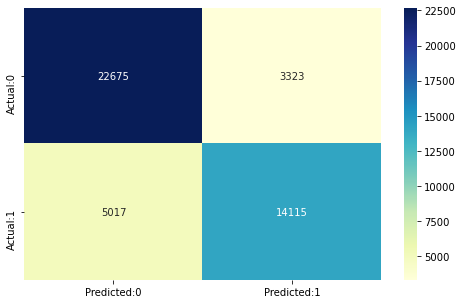

True negative: 22675
True Positive: 14115
False Negative: 5017
False Positive: 3323
The accuracy of the base model is:  81.52005317970308
The precision of the base model is:  80.94391558664985
The re-call calue of the base mode is:  73.776918252143
The f1-score of the base model is:  77.19442165709597


In [167]:
model_eval(y_test,y_pred_knn)

In [168]:
result_update('KNN',y_test,y_pred_knn)

In [169]:
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738


###### Implementing Base model for decision tree

In [170]:
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

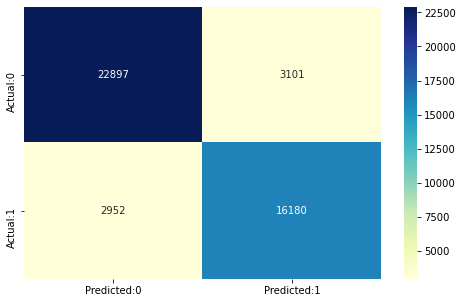

True negative: 22897
True Positive: 16180
False Negative: 2952
False Positive: 3101
The accuracy of the base model is:  86.58763571903391
The precision of the base model is:  83.91680929412375
The re-call calue of the base mode is:  84.57035333472716
The f1-score of the base model is:  84.24231380001562


In [171]:
model_eval(y_test,y_pred_dt)

In [172]:
result_update('Decision Tree',y_test,y_pred_dt)

In [173]:
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846


###### Implementing the base model for Random Forest

In [174]:
rfc.fit(X_train, y_train)
y_pred_rfc = rfc.predict(X_test)

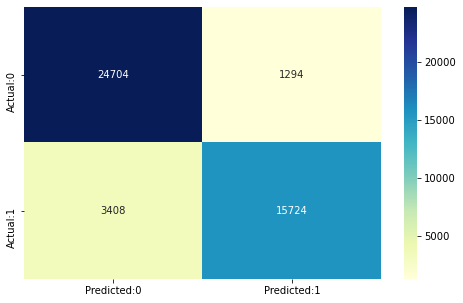

True negative: 24704
True Positive: 15724
False Negative: 3408
False Positive: 1294
The accuracy of the base model is:  89.58120983824507
The precision of the base model is:  92.39628628510988
The re-call calue of the base mode is:  82.18691197992891
The f1-score of the base model is:  86.99308437067772


In [175]:
model_eval(y_test,y_pred_rfc)

In [178]:
result_update('Random Forest',y_test,y_pred_rfc)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822


###### Implementation of base model of Naive Bayes

In [179]:
nb.fit(X_train, y_train)
y_pred_nb = nb.predict(X_test)

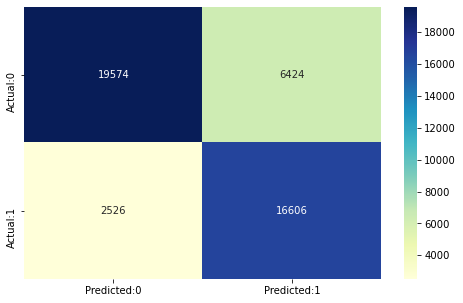

True negative: 19574
True Positive: 16606
False Negative: 2526
False Positive: 6424
The accuracy of the base model is:  80.16840239308664
The precision of the base model is:  72.10594876248372
The re-call calue of the base mode is:  86.79698933723604
The f1-score of the base model is:  78.77235425264456


In [180]:
model_eval(y_test,y_pred_nb)

In [181]:
result_update('Naive Bayes',y_test,y_pred_nb)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868


### HyperParameter Tuning

###### Hyperparameter tuning for KNN

In [182]:
knn_tunned=KNeighborsClassifier()

params_knn={'n_neighbors':sp_randint(1,40),'p':sp_randint(1,10)}

rsearch_knn=RandomizedSearchCV(knn_tunned,params_knn,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)
rsearch_knn.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
                   param_distributions={'n_neighbors': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD01441BB0>,
                                        'p': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD01441E50>},
                   random_state=0, scoring='roc_auc')

In [183]:
rsearch_knn.best_params_

{'n_neighbors': 25, 'p': 2}

In [184]:
knn_tunned=KNeighborsClassifier(**rsearch_knn.best_params_)

In [185]:
knn_tunned.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [186]:
y_pred_knn_tuned = knn_tunned.predict(X_test)

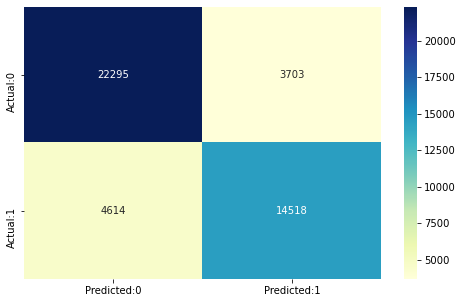

True negative: 22295
True Positive: 14518
False Negative: 4614
False Positive: 3703
The accuracy of the base model is:  81.57101706182141
The precision of the base model is:  79.6772954283519
The re-call calue of the base mode is:  75.88333681789672
The f1-score of the base model is:  77.73405081251842


In [187]:
model_eval(y_test,y_pred_knn_tuned)

In [188]:
result_update('KNN Tuned',y_test,y_pred_knn_tuned)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759


###### Hyperparameter Tuning for Random Forest

In [189]:
rfc_tunned=RandomForestClassifier(n_estimators=100,random_state=0)
params_rfc={'n_estimators':sp_randint(1,200),
        'max_features':sp_randint(1,18),
        'max_depth': sp_randint(2,20),
        'min_samples_split':sp_randint(2,40),
        'min_samples_leaf':sp_randint(1,30),
        'criterion':['gini','entropy']}

rsearch_rfc=RandomizedSearchCV(rfc_tunned,params_rfc,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)

rsearch_rfc.fit(X_train,y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=0),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD011D7160>,
                                        'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD0ADCAFD0>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD0140E220>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD011CD9D0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD01474B50>},
                   random_state=0, scoring='roc_auc')

In [190]:
rsearch_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 13,
 'max_features': 3,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 165}

In [191]:
rfc_tunned=RandomForestClassifier(**rsearch_rfc.best_params_,random_state=0)

In [192]:
rfc_tunned.fit(X_train,y_train)
y_pred_rfc_tunned = rfc_tunned.predict(X_test)

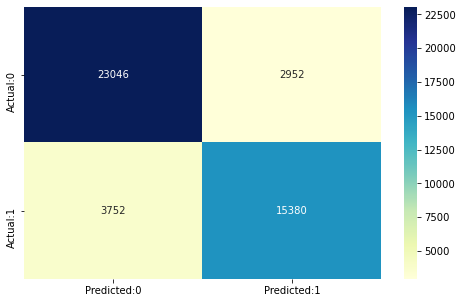

True negative: 23046
True Positive: 15380
False Negative: 3752
False Positive: 2952
The accuracy of the base model is:  85.14513627298913
The precision of the base model is:  83.89701069168667
The re-call calue of the base mode is:  80.38887727367761
The f1-score of the base model is:  82.10548793508434


In [193]:
model_eval(y_test,y_pred_rfc_tunned)

In [194]:
result_update('Random Forest Tuned',y_test,y_pred_rfc_tunned)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759
5,Random Forest Tuned,0.851,0.839,0.821,0.804


###### HyperPrameter tuning for Decision tree

In [195]:
dt_tunned=DecisionTreeClassifier(random_state=0)
params_dtc={'max_features':sp_randint(1,18),
        'max_depth': sp_randint(2,20),
        'min_samples_split':sp_randint(2,40),
        'min_samples_leaf':sp_randint(1,30),
        'criterion':['gini','entropy']}

rsearch_dt=RandomizedSearchCV(dt_tunned,params_dtc,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)

rsearch_dt.fit(X_train,y_train)

RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=0),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD00F04D90>,
                                        'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD00F31910>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD0123BEE0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD011F05E0>},
                   random_state=0, scoring='roc_auc')

In [196]:
rsearch_dt.best_params_

{'criterion': 'gini',
 'max_depth': 19,
 'max_features': 6,
 'min_samples_leaf': 26,
 'min_samples_split': 15}

In [197]:
dt_tunned=RandomForestClassifier(**rsearch_dt.best_params_,random_state=0)

In [198]:
dt_tunned.fit(X_train,y_train)
y_pred_dt_tunned = dt_tunned.predict(X_test)

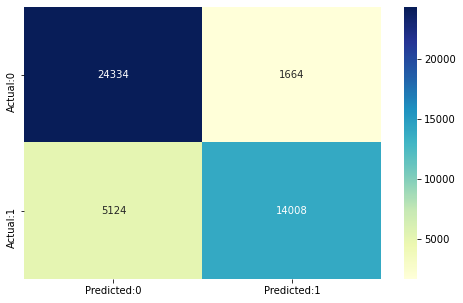

True negative: 24334
True Positive: 14008
False Negative: 5124
False Positive: 1664
The accuracy of the base model is:  84.95900731220918
The precision of the base model is:  89.38233792751403
The re-call calue of the base mode is:  73.21764582897762
The f1-score of the base model is:  80.49649465578669


In [199]:
model_eval(y_test,y_pred_dt_tunned)

In [200]:
result_update('Decision Tree Tuned',y_test,y_pred_dt_tunned)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759
5,Random Forest Tuned,0.851,0.839,0.821,0.804
6,Decision Tree Tuned,0.850,0.894,0.805,0.732


#### Ensemble Techniques

###### Bagging

In [201]:
from sklearn.ensemble import BaggingClassifier
bc = BaggingClassifier(random_state=0)

In [202]:
bc.fit(X_train,y_train)
y_pred_bc = bc.predict(X_test)

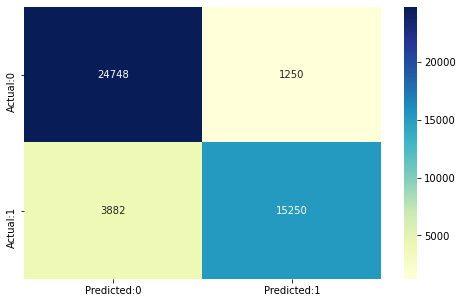

True negative: 24748
True Positive: 15250
False Negative: 3882
False Positive: 1250
The accuracy of the base model is:  88.62840682472857
The precision of the base model is:  92.42424242424242
The re-call calue of the base mode is:  79.70938741375706
The f1-score of the base model is:  85.5972159856309


In [203]:
model_eval(y_test,y_pred_bc)

In [204]:
result_update('Bagging',y_test,y_pred_bc)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759
5,Random Forest Tuned,0.851,0.839,0.821,0.804
6,Decision Tree Tuned,0.850,0.894,0.805,0.732
7,Bagging,0.886,0.924,0.856,0.797


###### Bagging with hyperparameter tuning

In [205]:
bc_tuned = BaggingClassifier(random_state=0)
params = {'base_estimator':[rsearch_dt,rsearch_knn,rsearch_rfc],
        'n_estimators':sp_randint(1,200),
         'max_samples':sp_randint(4,200),
         'max_features':sp_randint(0,20)}
rsearch_bagc = RandomizedSearchCV(bc_tuned,params,cv = 3, verbose = 1, n_jobs = -1)
rsearch_bagc.fit(X_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=BaggingClassifier(random_state=0), n_jobs=-1,
                   param_distributions={'base_estimator': [RandomizedSearchCV(cv=3,
                                                                              estimator=DecisionTreeClassifier(random_state=0),
                                                                              n_jobs=-1,
                                                                              param_distributions={'criterion': ['gini',
                                                                                                                 'entropy'],
                                                                                                   'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD00F04D90>,
                                                                                                   'max_features'...
                                                                   

In [206]:
rsearch_bagc.best_params_

{'base_estimator': RandomizedSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=0),
                    n_jobs=-1,
                    param_distributions={'criterion': ['gini', 'entropy'],
                                         'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD00F04D90>,
                                         'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD00F31910>,
                                         'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD0123BEE0>,
                                         'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001BD011F05E0>},
                    random_state=0, scoring='roc_auc'),
 'max_features': 11,
 'max_samples': 58,
 'n_estimators': 163}

In [207]:
bag_tunned=BaggingClassifier(**rsearch_bagc.best_params_,random_state=0)

In [208]:
bag_tunned.fit(X_train,y_train)
y_pred_bag_tunned = bag_tunned.predict(X_test)

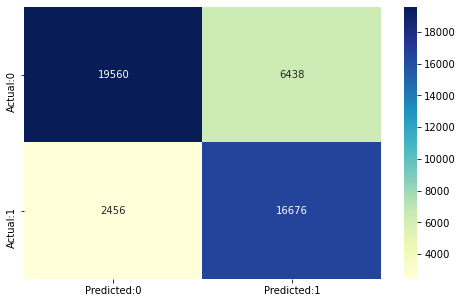

True negative: 19560
True Positive: 16676
False Negative: 2456
False Positive: 6438
The accuracy of the base model is:  80.29248836693995
The precision of the base model is:  72.14675088690836
The re-call calue of the base mode is:  87.16286849257789
The f1-score of the base model is:  78.94711925389386


In [209]:
model_eval(y_test,y_pred_bag_tunned)

In [210]:
result_update('Bagging Tuned',y_test,y_pred_bag_tunned)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759
5,Random Forest Tuned,0.851,0.839,0.821,0.804
6,Decision Tree Tuned,0.850,0.894,0.805,0.732
7,Bagging,0.886,0.924,0.856,0.797
8,Bagging Tuned,0.803,0.721,0.789,0.872


##### Boosting

###### Base model implementaion of AdaBoost

In [211]:
adaboost = AdaBoostClassifier(random_state=0)

adaboost.fit(X_train,y_train)
y_pred_adaboost = adaboost.predict(X_test)

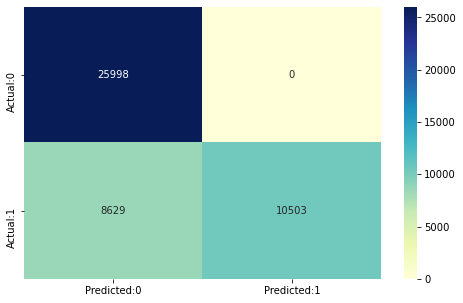

True negative: 25998
True Positive: 10503
False Negative: 8629
False Positive: 0
The accuracy of the base model is:  80.87968092178151
The precision of the base model is:  100.0
The re-call calue of the base mode is:  54.89755383650429
The f1-score of the base model is:  70.88240256453518


In [212]:
model_eval(y_test,y_pred_adaboost)

In [213]:
result_update('AdaBoost',y_test,y_pred_adaboost)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,KNN,0.815,0.809,0.772,0.738
1,Decision Tree,0.866,0.839,0.842,0.846
2,Random Forest,0.896,0.924,0.870,0.822
3,Naive Bayes,0.802,0.721,0.788,0.868
4,KNN Tuned,0.816,0.797,0.777,0.759
5,Random Forest Tuned,0.851,0.839,0.821,0.804
6,Decision Tree Tuned,0.850,0.894,0.805,0.732
7,Bagging,0.886,0.924,0.856,0.797
8,Bagging Tuned,0.803,0.721,0.789,0.872
9,AdaBoost,0.809,1.000,0.709,0.549


### Final Results

In [214]:
final_result = final_result.sort_values(by='Accuracy',ascending=False).reset_index(drop=True)
final_result

,Model Name,Accuracy,PRECISION,F1-SCORE,RECALL
0,Random Forest,0.896,0.924,0.870,0.822
1,Bagging,0.886,0.924,0.856,0.797
2,Decision Tree,0.866,0.839,0.842,0.846
3,Random Forest Tuned,0.851,0.839,0.821,0.804
4,Decision Tree Tuned,0.850,0.894,0.805,0.732
5,KNN Tuned,0.816,0.797,0.777,0.759
6,KNN,0.815,0.809,0.772,0.738
7,AdaBoost,0.809,1.000,0.709,0.549
8,Bagging Tuned,0.803,0.721,0.789,0.872
9,Naive Bayes,0.802,0.721,0.788,0.868


###### ROC CURVE for the top 4 models

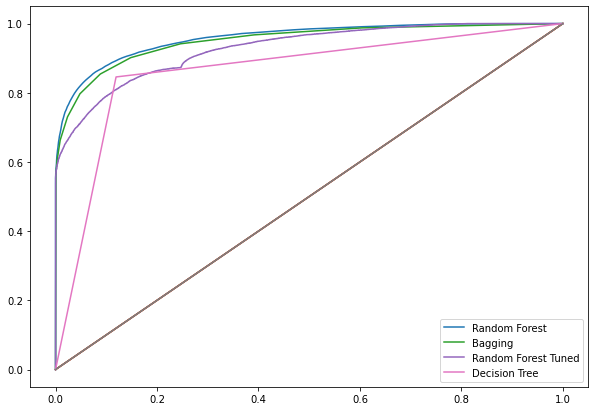

In [215]:
plt.figure(figsize=(10,7))
model_final=[('Random Forest',rfc),('Bagging',bc),
                ('Random Forest Tuned',rfc_tunned),('Decision Tree',dt)]
for name,algo in model_final:
    model_graph(name,algo,X_train,y_train,X_test,y_test)

###### Accuracy of the models

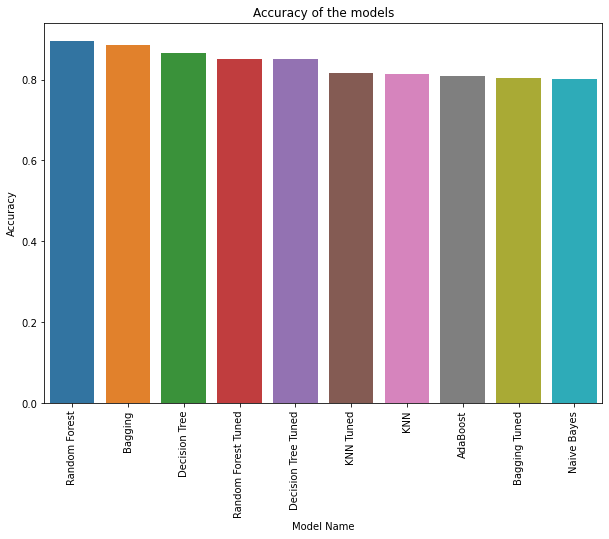

In [216]:
plt.figure(figsize=(10,7))
plt.title('Accuracy of the models')
sns.barplot(x=final_result['Model Name'],y=final_result['Accuracy'])
plt.xticks(rotation='vertical')
plt.show()

###### Precision of the models

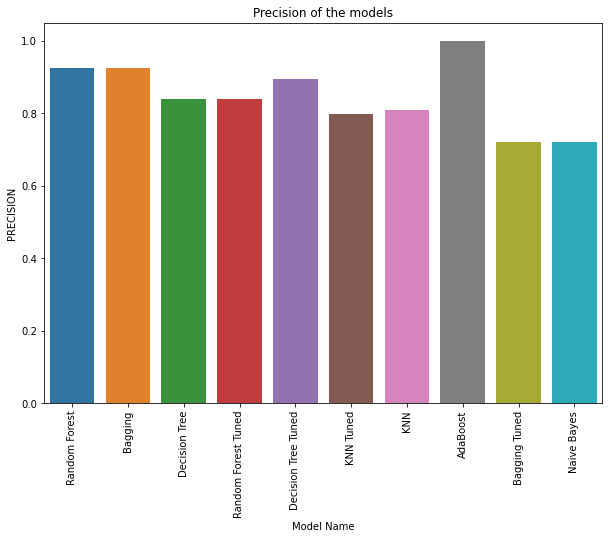

In [217]:
plt.figure(figsize=(10,7))
plt.title('Precision of the models')
sns.barplot(x=final_result['Model Name'],y=final_result['PRECISION'])
plt.xticks(rotation='vertical')
plt.show()

###### F1-Score of the model

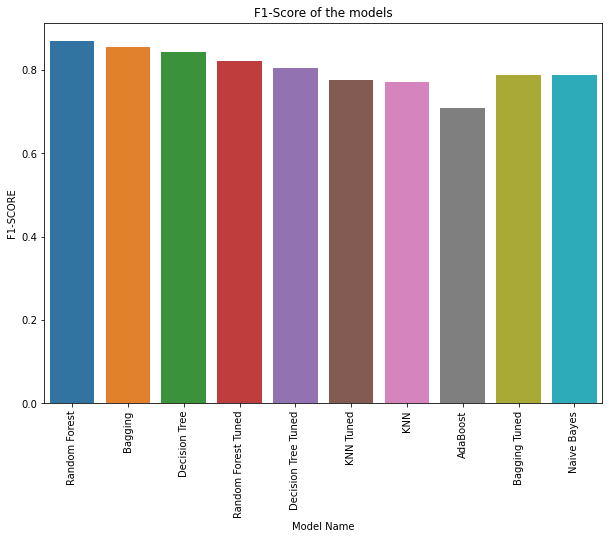

In [218]:
plt.figure(figsize=(10,7))
plt.title('F1-Score of the models')
sns.barplot(x=final_result['Model Name'],y=final_result['F1-SCORE'])
plt.xticks(rotation='vertical')
plt.show()

###### Recall of the Models

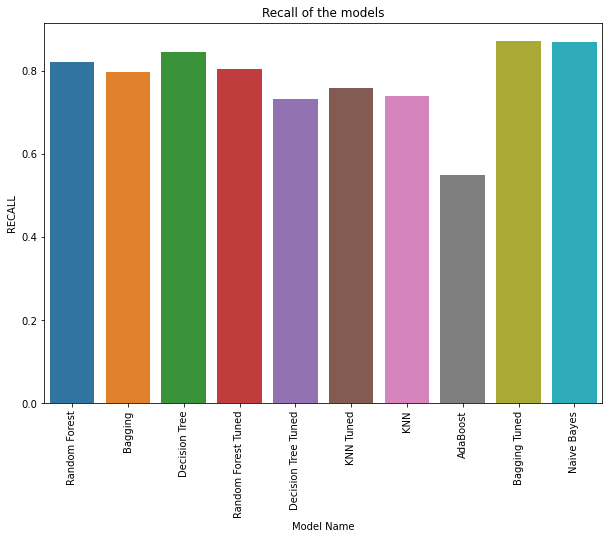

In [219]:
plt.figure(figsize=(10,7))
plt.title('Recall of the models')
sns.barplot(x=final_result['Model Name'],y=final_result['RECALL'])
plt.xticks(rotation='vertical')
plt.show()